In [2]:
import sys
print(sys.executable)

/Users/vittoriostile/miniconda3/envs/condaenv/bin/python


In [2]:
import os
import cv2
import numpy as np
from sklearn.model_selection import train_test_split
from tensorflow.keras.layers import Flatten, Dense, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt

ModuleNotFoundError: No module named 'tensorflow'

📊 Memory usage at prima del caricamento dei dati: 74.5%
Caricamento delle immagini FAKE...
✅ Caricate 28051 immagini FAKE.
Caricamento delle immagini REAL...
✅ Caricate 28483 immagini REAL.
Creazione e salvataggio dei chunk bilanciati...
🔄 Creazione del chunk 0 - Iterazione 1
📦 Chunk 0: 4000 immagini (FAKE + REAL)
✅ Salvato chunk 0 con 4000 immagini.
✅ Saved chunk 0 to disk.
📊 Memory usage at dopo il salvataggio del chunk 0: 66.1%
📊 Memory usage at dopo il garbage collector: 72.8%
🔄 Creazione del chunk 1 - Iterazione 2
📦 Chunk 1: 4000 immagini (FAKE + REAL)
✅ Salvato chunk 1 con 4000 immagini.
✅ Saved chunk 1 to disk.
📊 Memory usage at dopo il salvataggio del chunk 1: 63.6%
📊 Memory usage at dopo il garbage collector: 69.6%
🔄 Creazione del chunk 2 - Iterazione 3
📦 Chunk 2: 4000 immagini (FAKE + REAL)
✅ Salvato chunk 2 con 4000 immagini.
✅ Saved chunk 2 to disk.
📊 Memory usage at dopo il salvataggio del chunk 2: 60.9%
📊 Memory usage at dopo il garbage collector: 62.5%
🔄 Creazione del ch

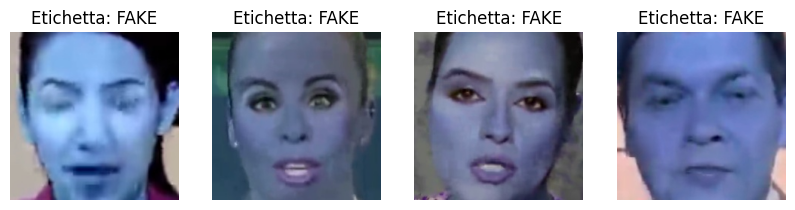

🖼️ Anteprima di 4 frame dal chunk 1:


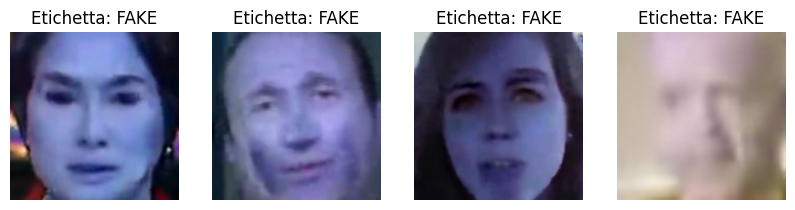

🖼️ Anteprima di 4 frame dal chunk 2:


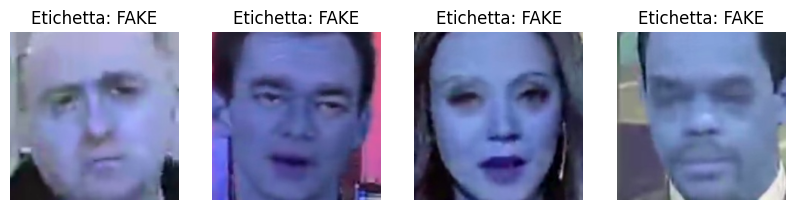

🖼️ Anteprima di 4 frame dal chunk 3:


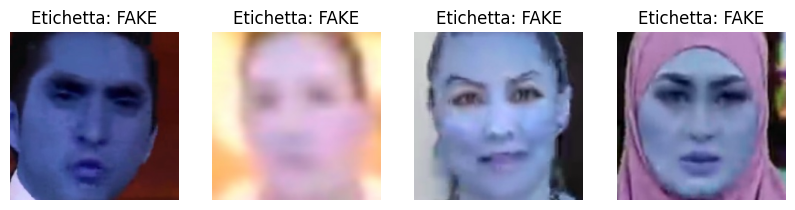

🖼️ Anteprima di 4 frame dal chunk 4:


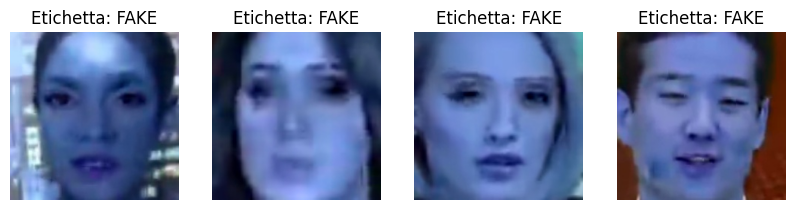

In [ ]:
import os
import cv2
import numpy as np
from sklearn.utils import shuffle
import psutil  # Per monitorare l'uso della memoria
import matplotlib.pyplot as plt  # Per visualizzare i frame
import gc  # Importa il modulo gc per la gestione della memoria


# Percorsi delle directory contenenti le facce estratte dai video FAKE e REAL
FAKE_FACES_PATH = "/Volumes/Macintosh SSD/FaceForensics_c40/manipulated_sequences/Deepfakes/c40/faces"
REAL_FACES_PATH = "/Volumes/Macintosh SSD/FaceForensics_c40/original_sequences/youtube/c40/faces"

# Etichette per i video REAL e FAKE
LABELS = {"REAL": 0, "FAKE": 1}

# Funzione per stampare l'uso della memoria
def print_memory_usage(stage):
    print(f"📊 Memory usage at {stage}: {psutil.virtual_memory().percent}%")

# Funzione per salvare i dati in chunk
def save_data_in_chunks(faces, labels, origins, chunk_index):
    os.makedirs("data_chunks", exist_ok=True)
    np.save(f"data_chunks/faces_chunk_{chunk_index}.npy", faces)
    np.save(f"data_chunks/labels_chunk_{chunk_index}.npy", labels)
    np.save(f"data_chunks/origins_chunk_{chunk_index}.npy", origins)
    print(f"✅ Saved chunk {chunk_index} to disk.")

# Funzione per caricare le immagini da una directory
def load_faces_from_directory(directory, label, origin_label):
    faces = []
    labels = []
    origins = []
    for filename in os.listdir(directory):
        if filename.endswith(".jpeg"):
            img_path = os.path.join(directory, filename)
            img = cv2.imread(img_path)
            if img is not None:
                img = img.astype("float32") / 255.0  # Converti in float32 e normalizza
                faces.append(img)
                labels.append(label)
                origins.append(origin_label)
    return faces, labels, origins

# Funzione per creare chunk bilanciati
def create_balanced_chunks(fake_faces, fake_labels, fake_origins, real_faces, real_labels, real_origins, chunk_size=2000):
    faces = []
    labels = []
    origins = []
    chunk_index = 0

    # Determina il numero di esempi per classe per ogni chunk
    half_chunk_size = chunk_size // 2

    # Shuffle dei dati per mescolare le immagini
    fake_faces, fake_labels, fake_origins = shuffle(fake_faces, fake_labels, fake_origins, random_state=42)
    real_faces, real_labels, real_origins = shuffle(real_faces, real_labels, real_origins, random_state=42)

    # Itera sui dati e crea chunk bilanciati
    for i in range(0, min(len(fake_faces), len(real_faces)), half_chunk_size):
        print(f"🔄 Creazione del chunk {chunk_index} - Iterazione {i // half_chunk_size + 1}")

        # Aggiungi immagini FAKE al chunk
        for j in range(i, i + half_chunk_size):
            if j < len(fake_faces):
                faces.append(fake_faces[j])
                labels.append(fake_labels[j])
                origins.append(fake_origins[j])

        # Aggiungi immagini REAL al chunk
        for j in range(i, i + half_chunk_size):
            if j < len(real_faces):
                faces.append(real_faces[j])
                labels.append(real_labels[j])
                origins.append(real_origins[j])

        print(f"📦 Chunk {chunk_index}: {len(faces)} immagini (FAKE + REAL)")

        # Salva il chunk quando raggiunge la dimensione specificata
        if len(faces) >= chunk_size:
            print(f"✅ Salvato chunk {chunk_index} con {len(faces)} immagini.")
            save_data_in_chunks(faces, labels, origins, chunk_index)
            print_memory_usage(f"dopo il salvataggio del chunk {chunk_index}")  # Stampa l'uso della memoria
            faces, labels, origins = [], [], []  # Svuota le liste
            gc.collect()  # Libera memoria inutilizzata
            print_memory_usage(f"dopo il garbage collector")  # Stampa l'uso della memoria dopo il garbage collector
            chunk_index += 1

    # Salva eventuali dati rimanenti
    if faces:
        print(f"✅ Salvato chunk finale {chunk_index} con {len(faces)} immagini.")
        save_data_in_chunks(faces, labels, origins, chunk_index)
        print_memory_usage(f"dopo il salvataggio del chunk finale {chunk_index}")  # Stampa l'uso della memoria
        gc.collect()  # Libera memoria inutilizzata
        print_memory_usage(f"dopo il garbage collector")  # Stampa l'uso della memoria dopo il garbage collector



# Funzione per mostrare un'anteprima di 4 frame da un chunk
def preview_frames_from_chunk(faces, labels, num_frames=4):
    plt.figure(figsize=(10, 10))
    for i in range(min(num_frames, len(faces))):
        plt.subplot(1, num_frames, i + 1)
        plt.imshow(faces[i])
        plt.title(f"Etichetta: {'FAKE' if labels[i] == 1 else 'REAL'}")
        plt.axis('off')
    plt.show()

# Funzione per verificare e mostrare anteprime di tutti i chunk
def check_all_chunks_with_preview():
    chunk_files = sorted([f for f in os.listdir("data_chunks") if f.startswith("faces_chunk_") and f.endswith(".npy")])
    num_chunks = len(chunk_files) // 3  # Ogni chunk ha 3 file: faces, labels, origins

    for chunk_index in range(num_chunks):
        # Carica i dati del chunk corrente
        faces = np.load(f"data_chunks/faces_chunk_{chunk_index}.npy")
        labels = np.load(f"data_chunks/labels_chunk_{chunk_index}.npy")
        origins = np.load(f"data_chunks/origins_chunk_{chunk_index}.npy")
        
        # Mostra un'anteprima di 4 frame
        print(f"🖼️ Anteprima di 4 frame dal chunk {chunk_index}:")
        preview_frames_from_chunk(faces, labels)

# Carica i dati FAKE e REAL
print_memory_usage("prima del caricamento dei dati")
print("Caricamento delle immagini FAKE...")
fake_faces, fake_labels, fake_origins = load_faces_from_directory(FAKE_FACES_PATH, LABELS["FAKE"], "FAKE")
print(f"✅ Caricate {len(fake_faces)} immagini FAKE.")

print("Caricamento delle immagini REAL...")
real_faces, real_labels, real_origins = load_faces_from_directory(REAL_FACES_PATH, LABELS["REAL"], "REAL")
print(f"✅ Caricate {len(real_faces)} immagini REAL.")

# Crea e salva chunk bilanciati
print("Creazione e salvataggio dei chunk bilanciati...")
create_balanced_chunks(fake_faces, fake_labels, fake_origins, real_faces, real_labels, real_origins, chunk_size=4000)
print_memory_usage("dopo la creazione dei chunk bilanciati")

# Mostra anteprime di tutti i chunk
check_all_chunks_with_preview()

In [ ]:
import os
import numpy as np

# Funzione per calcolare il numero di FAKE e REAL in ogni chunk
def calculate_fake_real_per_chunk():
    # Trova tutti i file dei chunk nella directory
    chunk_files = sorted([f for f in os.listdir("data_chunks") if f.startswith("labels_chunk_") and f.endswith(".npy")])
    num_chunks = len(chunk_files)

    if num_chunks == 0:
        print("⚠️ Nessun chunk trovato nella directory 'data_chunks'.")
        return

    # Itera su ogni chunk e calcola il numero di FAKE e REAL
    for chunk_index in range(num_chunks):
        # Carica i dati delle etichette
        labels = np.load(f"data_chunks/labels_chunk_{chunk_index}.npy")

        # Conta il numero di FAKE (1) e REAL (0)
        num_fake = np.sum(labels == 1)
        num_real = np.sum(labels == 0)

        # Stampa i risultati
        print(f"📦 Chunk {chunk_index}: FAKE = {num_fake}, REAL = {num_real}")

# Esegui la funzione
calculate_fake_real_per_chunk()

📦 Chunk 0: FAKE = 2000, REAL = 2000
📦 Chunk 1: FAKE = 2000, REAL = 2000
📦 Chunk 2: FAKE = 2000, REAL = 2000
📦 Chunk 3: FAKE = 2000, REAL = 2000
📦 Chunk 4: FAKE = 2000, REAL = 2000
📦 Chunk 5: FAKE = 2000, REAL = 2000
📦 Chunk 6: FAKE = 2000, REAL = 2000
📦 Chunk 7: FAKE = 2000, REAL = 2000
📦 Chunk 8: FAKE = 2000, REAL = 2000
📦 Chunk 9: FAKE = 2000, REAL = 2000
📦 Chunk 10: FAKE = 2000, REAL = 2000
📦 Chunk 11: FAKE = 2000, REAL = 2000
📦 Chunk 12: FAKE = 2000, REAL = 2000
📦 Chunk 13: FAKE = 2000, REAL = 2000


In [ ]:
def load_filenames_from_directory(directory, label):
    filenames = []  # Nuovo array per salvare i nomi dei file
    for filename in os.listdir(directory):
        if filename.endswith(".jpeg"):
            filenames.append(filename)  # Salva solo il nome del file
    return filenames

def create_filenames_chunks(fake_filenames, real_filenames, chunk_size=4000):
    filenames = []  # Nuovo array per i nomi dei file
    chunk_index = 0

    # Determina il numero di esempi per classe per ogni chunk
    half_chunk_size = chunk_size // 2

    # Shuffle dei dati per mescolare i nomi dei file
    fake_filenames = shuffle(fake_filenames, random_state=42)
    real_filenames = shuffle(real_filenames, random_state=42)

    # Itera sui dati e crea chunk bilanciati
    for i in range(0, min(len(fake_filenames), len(real_filenames)), half_chunk_size):
        print(f"🔄 Creazione del chunk {chunk_index} - Iterazione {i // half_chunk_size + 1}")

        # Aggiungi nomi dei file FAKE al chunk
        for j in range(i, i + half_chunk_size):
            if j < len(fake_filenames):
                filenames.append(fake_filenames[j])

        # Aggiungi nomi dei file REAL al chunk
        for j in range(i, i + half_chunk_size):
            if j < len(real_filenames):
                filenames.append(real_filenames[j])

        print(f"📦 Chunk {chunk_index}: {len(filenames)} nomi di file (FAKE + REAL)")

        # Salva il chunk quando raggiunge la dimensione specificata
        if len(filenames) >= chunk_size:
            print(f"✅ Salvato chunk {chunk_index} con {len(filenames)} nomi di file.")
            save_filenames_chunk(filenames, chunk_index)
            filenames = []  # Svuota la lista
            chunk_index += 1

    # Salva eventuali dati rimanenti
    if filenames:
        print(f"✅ Salvato chunk finale {chunk_index} con {len(filenames)} nomi di file.")
        save_filenames_chunk(filenames, chunk_index)

def save_filenames_chunk(filenames, chunk_index):
    os.makedirs("data_chunks", exist_ok=True)
    np.save(f"data_chunks/filenames_chunk_{chunk_index}.npy", filenames)  # Salva i nomi dei file
    print(f"✅ Saved filenames_chunk_{chunk_index}.npy to disk.")

In [ ]:
from sklearn.utils import shuffle

# Definizione delle etichette per i video REAL e FAKE
LABELS = {"REAL": 0, "FAKE": 1}

# Blocco per eseguire le funzioni
if __name__ == "__main__": # Permette di distinguere se un file Python viene eseguito direttamente o importato come modulo in un altro script
    # Percorsi delle directory contenenti le facce estratte dai video FAKE e REAL
    FAKE_FACES_PATH = "/Volumes/Macintosh SSD/FaceForensics_c40/manipulated_sequences/Deepfakes/c40/faces"
    REAL_FACES_PATH = "/Volumes/Macintosh SSD/FaceForensics_c40/original_sequences/youtube/c40/faces"

    # Carica i nomi dei file FAKE e REAL
    print("Caricamento dei nomi dei file FAKE...")
    fake_filenames = load_filenames_from_directory(FAKE_FACES_PATH, LABELS["FAKE"])
    print(f"✅ Caricati {len(fake_filenames)} nomi di file FAKE.")

    print("Caricamento dei nomi dei file REAL...")
    real_filenames = load_filenames_from_directory(REAL_FACES_PATH, LABELS["REAL"])
    print(f"✅ Caricati {len(real_filenames)} nomi di file REAL.")

    # Crea e salva chunk bilanciati di nomi di file
    print("Creazione e salvataggio dei chunk di nomi di file bilanciati...")
    create_filenames_chunks(fake_filenames, real_filenames, chunk_size=4000)

Caricamento dei nomi dei file FAKE...
✅ Caricati 28051 nomi di file FAKE.
Caricamento dei nomi dei file REAL...
✅ Caricati 28483 nomi di file REAL.
Creazione e salvataggio dei chunk di nomi di file bilanciati...
🔄 Creazione del chunk 0 - Iterazione 1
📦 Chunk 0: 4000 nomi di file (FAKE + REAL)
✅ Salvato chunk 0 con 4000 nomi di file.
✅ Saved filenames_chunk_0.npy to disk.
🔄 Creazione del chunk 1 - Iterazione 2
📦 Chunk 1: 4000 nomi di file (FAKE + REAL)
✅ Salvato chunk 1 con 4000 nomi di file.
✅ Saved filenames_chunk_1.npy to disk.
🔄 Creazione del chunk 2 - Iterazione 3
📦 Chunk 2: 4000 nomi di file (FAKE + REAL)
✅ Salvato chunk 2 con 4000 nomi di file.
✅ Saved filenames_chunk_2.npy to disk.
🔄 Creazione del chunk 3 - Iterazione 4
📦 Chunk 3: 4000 nomi di file (FAKE + REAL)
✅ Salvato chunk 3 con 4000 nomi di file.
✅ Saved filenames_chunk_3.npy to disk.
🔄 Creazione del chunk 4 - Iterazione 5
📦 Chunk 4: 4000 nomi di file (FAKE + REAL)
✅ Salvato chunk 4 con 4000 nomi di file.
✅ Saved filenames

In [ ]:
import os
import numpy as np

# Funzione per ottenere la lista di frame e relative etichette del primo e ultimo chunk
def show_first_and_last_chunk():
    # Trova tutti i file dei chunk nella directory
    chunk_files = sorted([f for f in os.listdir("data_chunks") if f.startswith("faces_chunk_") and f.endswith(".npy")])
    num_chunks = len(chunk_files)  # Ogni chunk ha 3 file: faces, labels, origins ma contiamo solo i faces

    if num_chunks == 0:
        print("⚠️ Nessun chunk trovato nella directory 'data_chunks'.")
        return

    # Indici del primo e ultimo chunk
    first_chunk_index = 0
    last_chunk_index = num_chunks - 1

    # Funzione per stampare i dettagli di un chunk
    def print_chunk_details(chunk_index):
        print(f"\n🔍 Caricamento del chunk {chunk_index}...")
        faces = np.load(f"data_chunks/faces_chunk_{chunk_index}.npy")
        labels = np.load(f"data_chunks/labels_chunk_{chunk_index}.npy")
        filenames = np.load(f"data_chunks/filenames_chunk_{chunk_index}.npy")

        print(f"📦 Chunk {chunk_index}: {len(faces)} immagini")
        for i in range(len(faces)):  # Itera su tutti i frame
            print(f"Frame {i + 1}: Etichetta = {'FAKE' if labels[i] == 1 else 'REAL'}, Origine = {filenames[i]}")

    # Stampa i dettagli del primo chunk
    print_chunk_details(first_chunk_index)

    # Stampa i dettagli dell'ultimo chunk
    print_chunk_details(last_chunk_index)

# Esegui la funzione
show_first_and_last_chunk()


🔍 Caricamento del chunk 0...
📦 Chunk 0: 4000 immagini
Frame 1: Etichetta = FAKE, Origine = 206_221_340_face0.jpeg
Frame 2: Etichetta = FAKE, Origine = 086_090_580_face0.jpeg
Frame 3: Etichetta = FAKE, Origine = 825_074_100_face0.jpeg
Frame 4: Etichetta = FAKE, Origine = 903_792_460_face0.jpeg
Frame 5: Etichetta = FAKE, Origine = 336_338_120_face0.jpeg
Frame 6: Etichetta = FAKE, Origine = 157_245_480_face0.jpeg
Frame 7: Etichetta = FAKE, Origine = 538_493_140_face0.jpeg
Frame 8: Etichetta = FAKE, Origine = 646_643_360_face0.jpeg
Frame 9: Etichetta = FAKE, Origine = 115_939_000_face1.jpeg
Frame 10: Etichetta = FAKE, Origine = 018_019_160_face0.jpeg
Frame 11: Etichetta = FAKE, Origine = 661_670_200_face0.jpeg
Frame 12: Etichetta = FAKE, Origine = 593_577_180_face0.jpeg
Frame 13: Etichetta = FAKE, Origine = 284_263_040_face1.jpeg
Frame 14: Etichetta = FAKE, Origine = 027_009_140_face0.jpeg
Frame 15: Etichetta = FAKE, Origine = 683_607_240_face0.jpeg
Frame 16: Etichetta = FAKE, Origine = 1

In [ ]:
# --- BLOCCO DI CARICAMENTO DEL MODELLO ---
# Se carichi un modello precedentemente addestrato salta la fase di training

# Import necessario per riconoscere l’optimizer legacy usato nel salvataggio
from tensorflow.keras.optimizers.legacy import Adam
from tensorflow.keras.models import load_model

# Caricamento del modello completo
model = load_model("deepfake_model-14-chunks_vgg16.h5")
print("✅ Modello caricato correttamente dal file .h5 (con legacy.Adam)")

✅ Modello caricato correttamente dal file .keras (con legacy.Adam)


Caricamento del chunk 0 per il training...
✅ Loaded chunk 0 from disk.


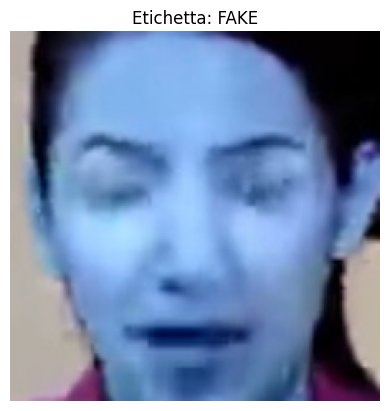

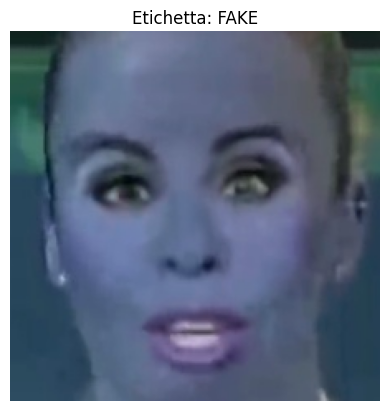

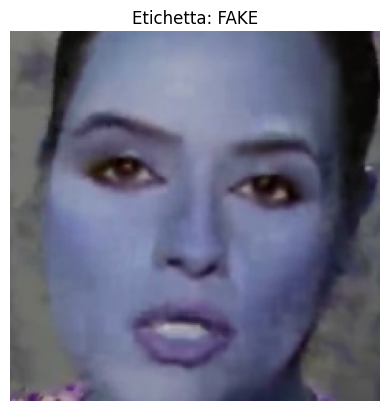

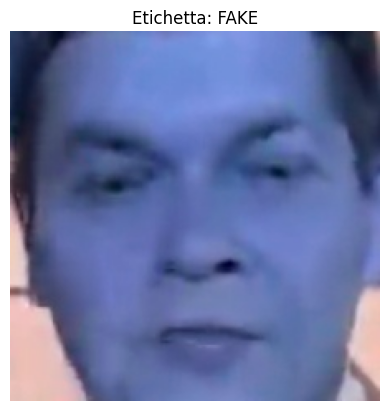

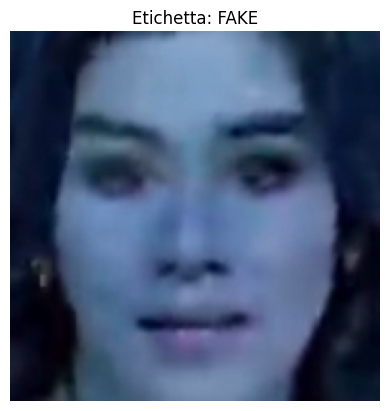

📊 Distribuzione delle classi (Chunk 0): {0: 2000, 1: 2000}
📊 Distribuzione delle classi (Training Set): {0: 1440, 1: 1440}
📊 Distribuzione delle classi (Validation Set): {0: 280, 1: 280}
📊 Distribuzione delle classi (Test Set): {0: 280, 1: 280}
Training set: 2880 samples
Validation set: 560 samples
Test set: 560 samples
Epoch 1/5
180/180 [==============================] - 378s 2s/step - loss: 0.6456 - accuracy: 0.6476 - val_loss: 0.5462 - val_accuracy: 0.7107
Epoch 2/5
180/180 [==============================] - 375s 2s/step - loss: 0.4937 - accuracy: 0.7476 - val_loss: 0.6577 - val_accuracy: 0.6304
Epoch 3/5
180/180 [==============================] - 358s 2s/step - loss: 0.4327 - accuracy: 0.7941 - val_loss: 0.4972 - val_accuracy: 0.7214
Epoch 4/5
180/180 [==============================] - 354s 2s/step - loss: 0.3755 - accuracy: 0.8396 - val_loss: 0.4388 - val_accuracy: 0.7821
Epoch 5/5
180/180 [==============================] - 354s 2s/step - loss: 0.3474 - accuracy: 0.8497 - val_loss

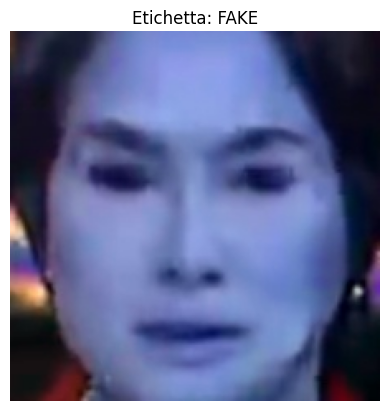

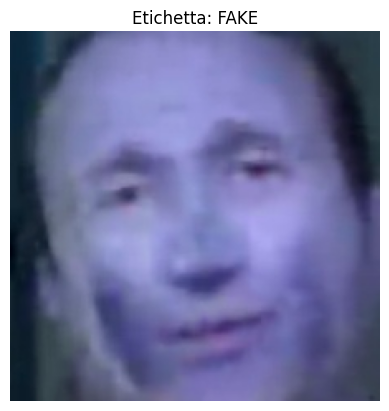

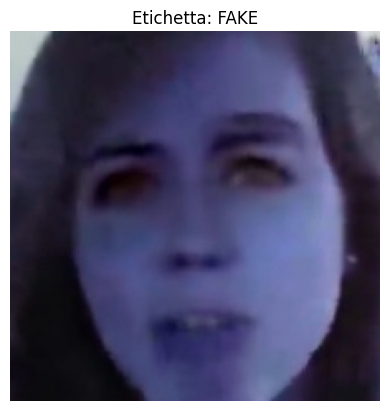

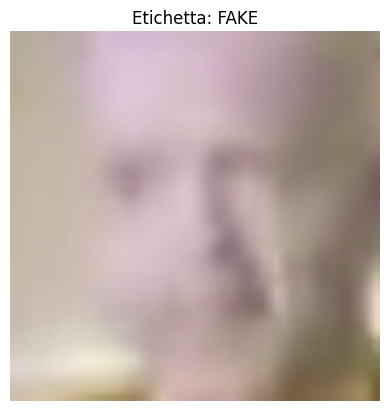

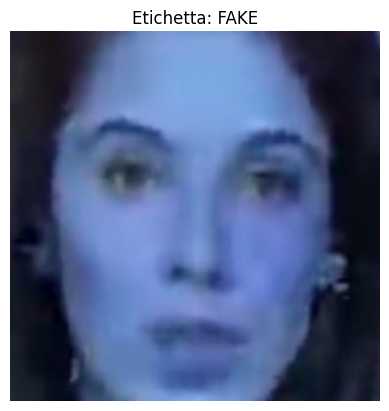

📊 Distribuzione delle classi (Chunk 1): {0: 2000, 1: 2000}
📊 Distribuzione delle classi (Training Set): {0: 1440, 1: 1440}
📊 Distribuzione delle classi (Validation Set): {0: 280, 1: 280}
📊 Distribuzione delle classi (Test Set): {0: 280, 1: 280}
Training set: 2880 samples
Validation set: 560 samples
Test set: 560 samples
Epoch 1/5
180/180 [==============================] - 377s 2s/step - loss: 0.5102 - accuracy: 0.7476 - val_loss: 0.5226 - val_accuracy: 0.7500
Epoch 2/5
180/180 [==============================] - 369s 2s/step - loss: 0.4061 - accuracy: 0.8142 - val_loss: 0.4887 - val_accuracy: 0.7679
Epoch 3/5
180/180 [==============================] - 375s 2s/step - loss: 0.3622 - accuracy: 0.8326 - val_loss: 0.4267 - val_accuracy: 0.7946
Epoch 4/5
180/180 [==============================] - 369s 2s/step - loss: 0.3140 - accuracy: 0.8698 - val_loss: 0.4326 - val_accuracy: 0.7786
Epoch 5/5
180/180 [==============================] - 362s 2s/step - loss: 0.3055 - accuracy: 0.8694 - val_loss

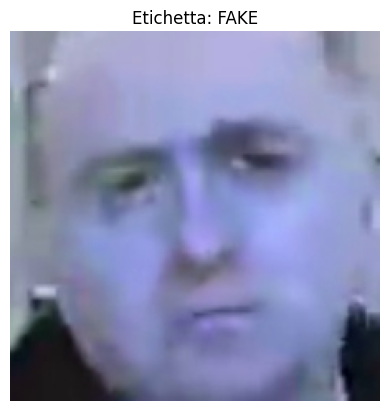

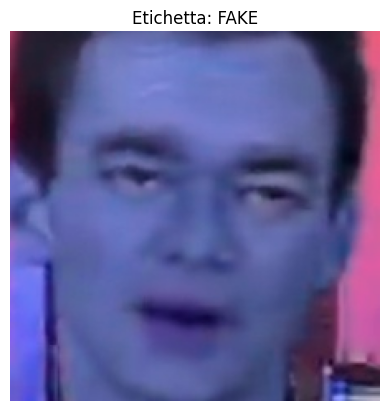

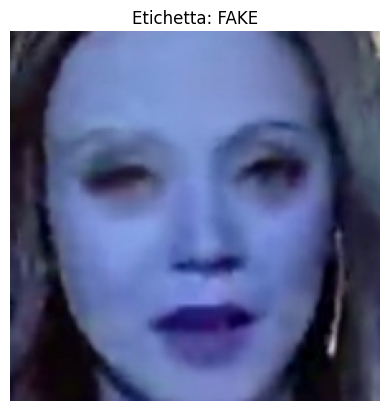

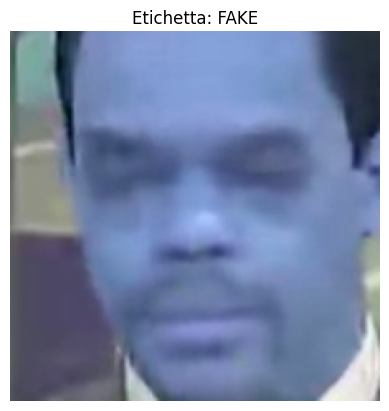

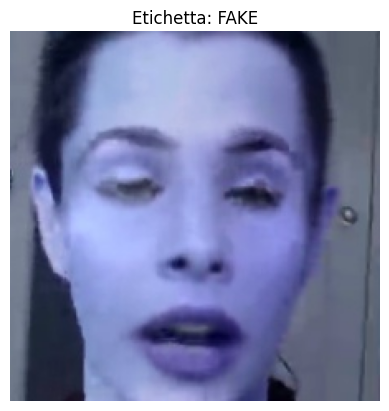

📊 Distribuzione delle classi (Chunk 2): {0: 2000, 1: 2000}
📊 Distribuzione delle classi (Training Set): {0: 1440, 1: 1440}
📊 Distribuzione delle classi (Validation Set): {0: 280, 1: 280}
📊 Distribuzione delle classi (Test Set): {0: 280, 1: 280}
Training set: 2880 samples
Validation set: 560 samples
Test set: 560 samples
Epoch 1/5
180/180 [==============================] - 364s 2s/step - loss: 0.4414 - accuracy: 0.7840 - val_loss: 0.4433 - val_accuracy: 0.7982
Epoch 2/5
180/180 [==============================] - 349s 2s/step - loss: 0.3816 - accuracy: 0.8243 - val_loss: 0.4615 - val_accuracy: 0.7464
Epoch 3/5
180/180 [==============================] - 341s 2s/step - loss: 0.3201 - accuracy: 0.8549 - val_loss: 0.4065 - val_accuracy: 0.7911
Epoch 4/5
180/180 [==============================] - 342s 2s/step - loss: 0.3140 - accuracy: 0.8545 - val_loss: 0.4104 - val_accuracy: 0.8125
Epoch 5/5
180/180 [==============================] - 338s 2s/step - loss: 0.2602 - accuracy: 0.8913 - val_loss

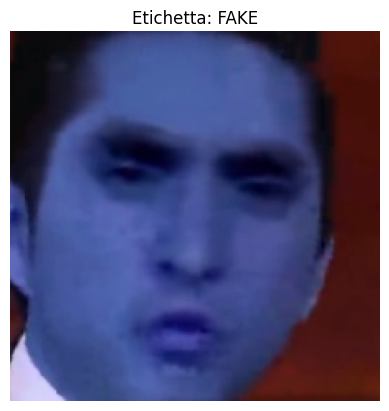

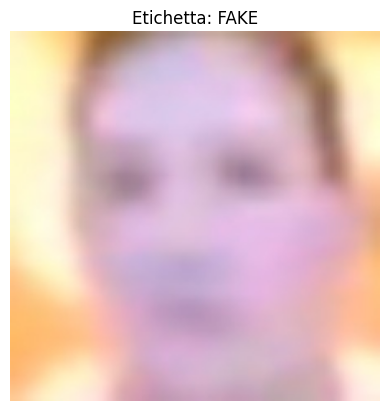

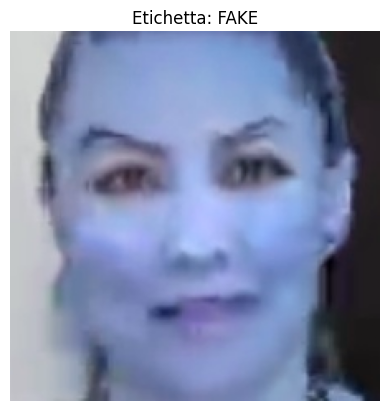

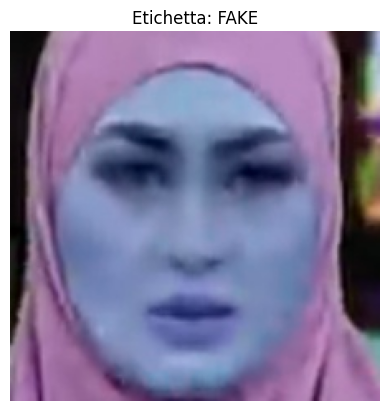

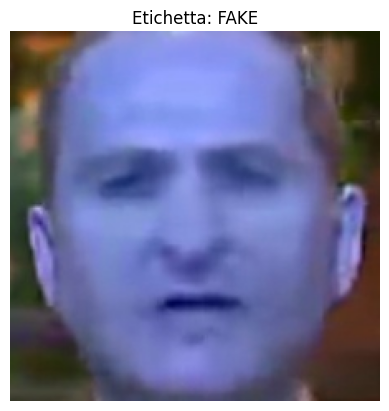

📊 Distribuzione delle classi (Chunk 3): {0: 2000, 1: 2000}
📊 Distribuzione delle classi (Training Set): {0: 1440, 1: 1440}
📊 Distribuzione delle classi (Validation Set): {0: 280, 1: 280}
📊 Distribuzione delle classi (Test Set): {0: 280, 1: 280}
Training set: 2880 samples
Validation set: 560 samples
Test set: 560 samples
Epoch 1/5
180/180 [==============================] - 349s 2s/step - loss: 0.4201 - accuracy: 0.8028 - val_loss: 0.3650 - val_accuracy: 0.8232
Epoch 2/5
180/180 [==============================] - 346s 2s/step - loss: 0.3439 - accuracy: 0.8472 - val_loss: 0.3676 - val_accuracy: 0.8143
Epoch 3/5
180/180 [==============================] - 337s 2s/step - loss: 0.2907 - accuracy: 0.8681 - val_loss: 0.3784 - val_accuracy: 0.8089
Epoch 4/5
180/180 [==============================] - 336s 2s/step - loss: 0.2754 - accuracy: 0.8778 - val_loss: 0.3897 - val_accuracy: 0.8268
Epoch 5/5
180/180 [==============================] - 329s 2s/step - loss: 0.2459 - accuracy: 0.9021 - val_loss

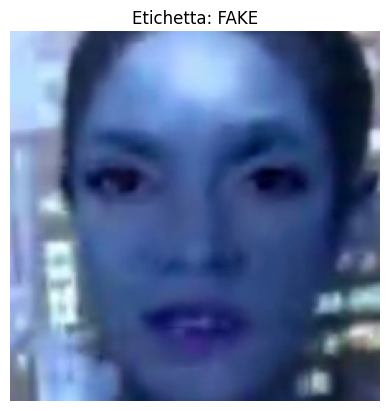

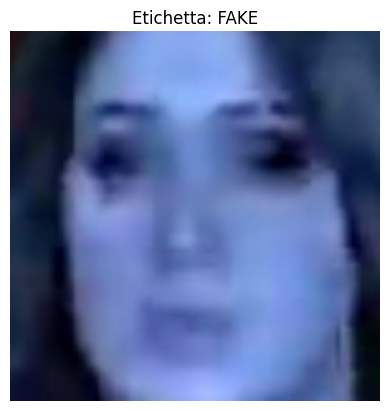

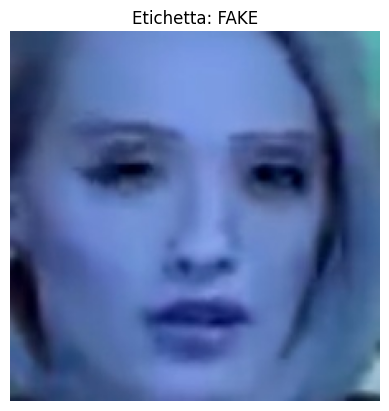

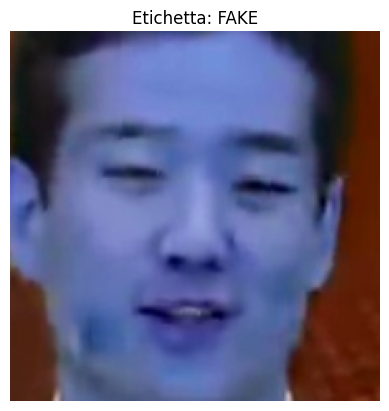

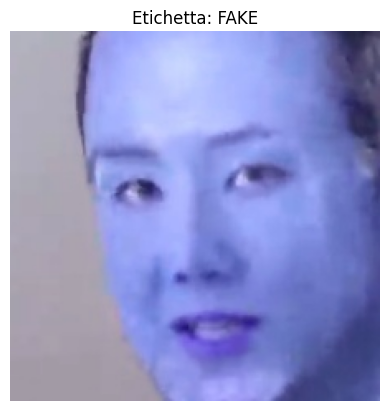

📊 Distribuzione delle classi (Chunk 4): {0: 2000, 1: 2000}
📊 Distribuzione delle classi (Training Set): {0: 1440, 1: 1440}
📊 Distribuzione delle classi (Validation Set): {0: 280, 1: 280}
📊 Distribuzione delle classi (Test Set): {0: 280, 1: 280}
Training set: 2880 samples
Validation set: 560 samples
Test set: 560 samples
Epoch 1/5
180/180 [==============================] - 330s 2s/step - loss: 0.4194 - accuracy: 0.8000 - val_loss: 0.4025 - val_accuracy: 0.8054
Epoch 2/5
180/180 [==============================] - 323s 2s/step - loss: 0.3287 - accuracy: 0.8448 - val_loss: 0.3484 - val_accuracy: 0.8429
Epoch 3/5
180/180 [==============================] - 325s 2s/step - loss: 0.2881 - accuracy: 0.8701 - val_loss: 0.3459 - val_accuracy: 0.8518
Epoch 4/5
180/180 [==============================] - 325s 2s/step - loss: 0.2489 - accuracy: 0.8993 - val_loss: 0.3423 - val_accuracy: 0.8446
Epoch 5/5
180/180 [==============================] - 345s 2s/step - loss: 0.2214 - accuracy: 0.9076 - val_loss

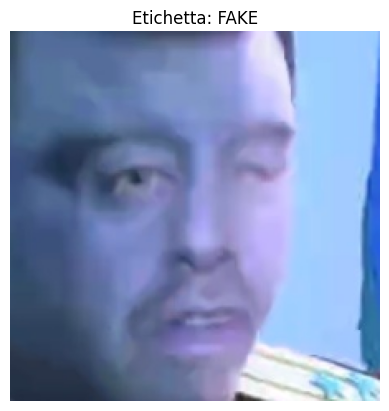

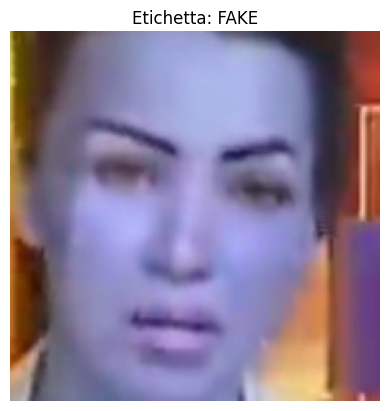

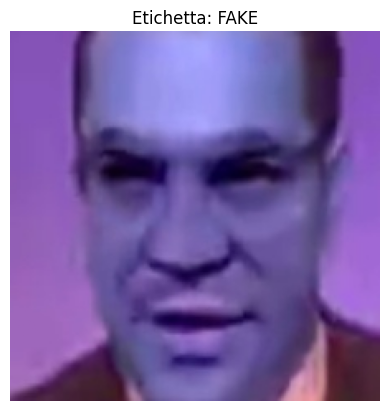

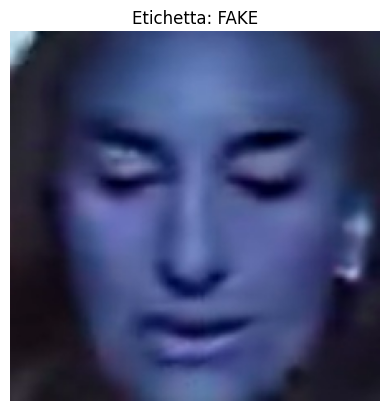

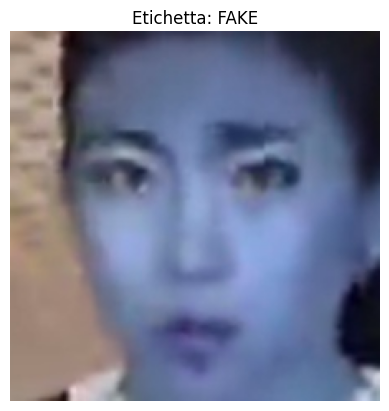

📊 Distribuzione delle classi (Chunk 5): {0: 2000, 1: 2000}
📊 Distribuzione delle classi (Training Set): {0: 1440, 1: 1440}
📊 Distribuzione delle classi (Validation Set): {0: 280, 1: 280}
📊 Distribuzione delle classi (Test Set): {0: 280, 1: 280}
Training set: 2880 samples
Validation set: 560 samples
Test set: 560 samples
Epoch 1/5
180/180 [==============================] - 354s 2s/step - loss: 0.4147 - accuracy: 0.8014 - val_loss: 0.3602 - val_accuracy: 0.8446
Epoch 2/5
180/180 [==============================] - 340s 2s/step - loss: 0.3198 - accuracy: 0.8521 - val_loss: 0.3850 - val_accuracy: 0.8286
Epoch 3/5
180/180 [==============================] - 345s 2s/step - loss: 0.2773 - accuracy: 0.8729 - val_loss: 0.4453 - val_accuracy: 0.8018
Epoch 4/5
180/180 [==============================] - 353s 2s/step - loss: 0.2463 - accuracy: 0.8944 - val_loss: 0.3645 - val_accuracy: 0.8411
Epoch 5/5
180/180 [==============================] - 356s 2s/step - loss: 0.2189 - accuracy: 0.9076 - val_loss

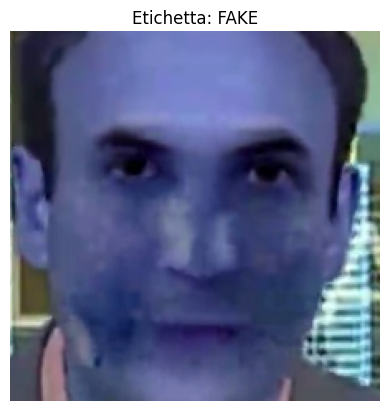

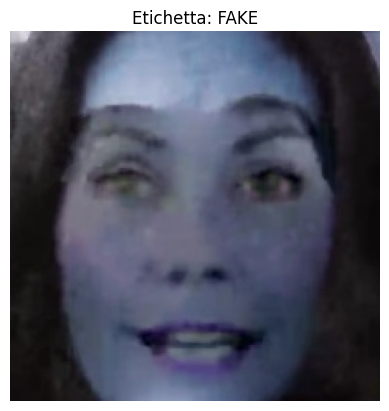

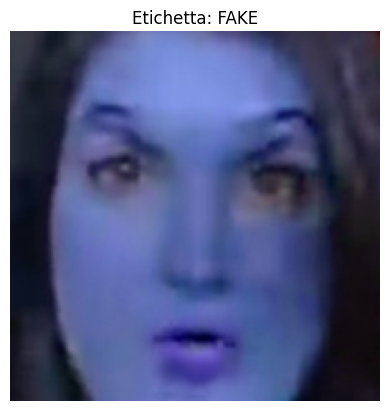

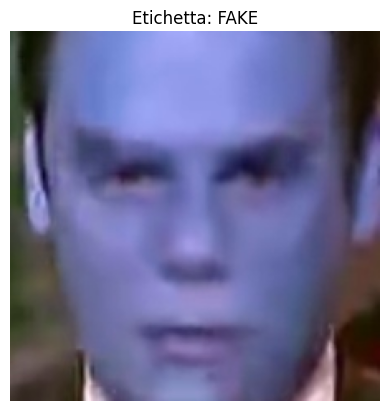

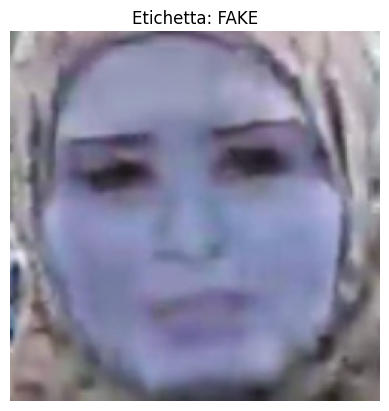

📊 Distribuzione delle classi (Chunk 6): {0: 2000, 1: 2000}
📊 Distribuzione delle classi (Training Set): {0: 1440, 1: 1440}
📊 Distribuzione delle classi (Validation Set): {0: 280, 1: 280}
📊 Distribuzione delle classi (Test Set): {0: 280, 1: 280}
Training set: 2880 samples
Validation set: 560 samples
Test set: 560 samples
Epoch 1/5
180/180 [==============================] - 349s 2s/step - loss: 0.3767 - accuracy: 0.8194 - val_loss: 0.3340 - val_accuracy: 0.8607
Epoch 2/5
180/180 [==============================] - 329s 2s/step - loss: 0.2948 - accuracy: 0.8667 - val_loss: 0.3208 - val_accuracy: 0.8661
Epoch 3/5
180/180 [==============================] - 342s 2s/step - loss: 0.2587 - accuracy: 0.8781 - val_loss: 0.3291 - val_accuracy: 0.8607
Epoch 4/5
180/180 [==============================] - 352s 2s/step - loss: 0.2213 - accuracy: 0.9062 - val_loss: 0.3214 - val_accuracy: 0.8536
Epoch 5/5
180/180 [==============================] - 332s 2s/step - loss: 0.2081 - accuracy: 0.9167 - val_loss

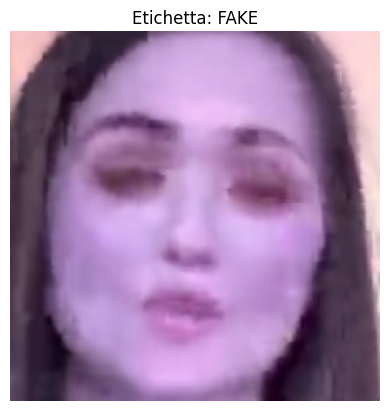

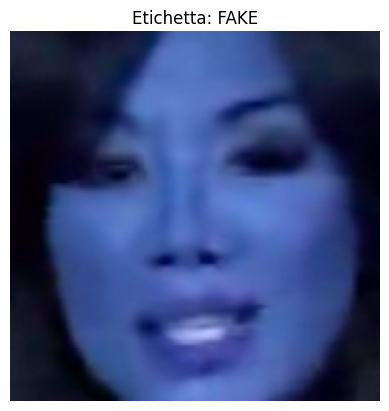

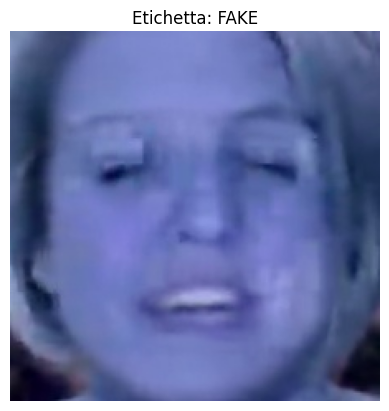

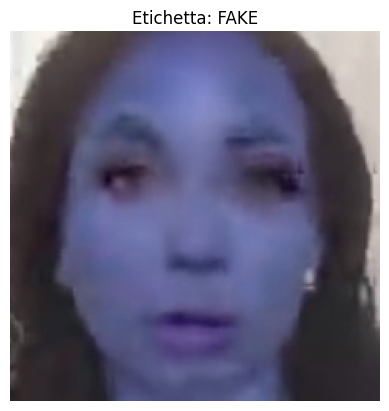

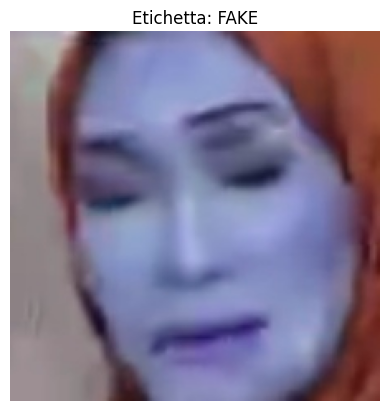

📊 Distribuzione delle classi (Chunk 7): {0: 2000, 1: 2000}
📊 Distribuzione delle classi (Training Set): {0: 1440, 1: 1440}
📊 Distribuzione delle classi (Validation Set): {0: 280, 1: 280}
📊 Distribuzione delle classi (Test Set): {0: 280, 1: 280}
Training set: 2880 samples
Validation set: 560 samples
Test set: 560 samples
Epoch 1/5
180/180 [==============================] - 343s 2s/step - loss: 0.3619 - accuracy: 0.8302 - val_loss: 0.3187 - val_accuracy: 0.8411
Epoch 2/5
180/180 [==============================] - 330s 2s/step - loss: 0.2800 - accuracy: 0.8677 - val_loss: 0.3574 - val_accuracy: 0.8214
Epoch 3/5
180/180 [==============================] - 320s 2s/step - loss: 0.2506 - accuracy: 0.8882 - val_loss: 0.3187 - val_accuracy: 0.8411
Epoch 4/5
180/180 [==============================] - 323s 2s/step - loss: 0.2158 - accuracy: 0.9094 - val_loss: 0.3409 - val_accuracy: 0.8446
Epoch 5/5
180/180 [==============================] - 334s 2s/step - loss: 0.2058 - accuracy: 0.9073 - val_loss

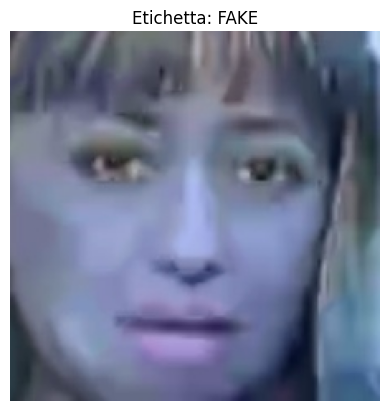

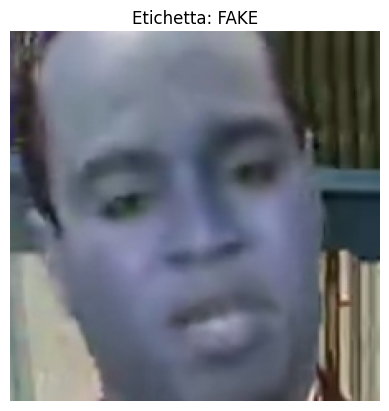

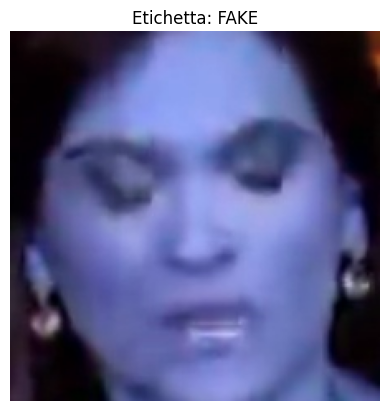

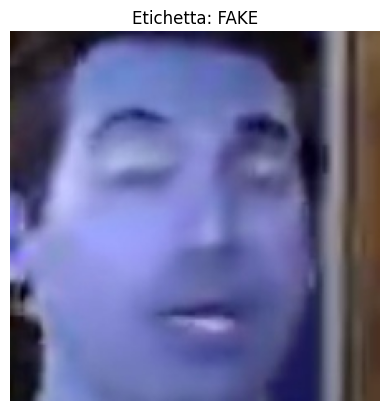

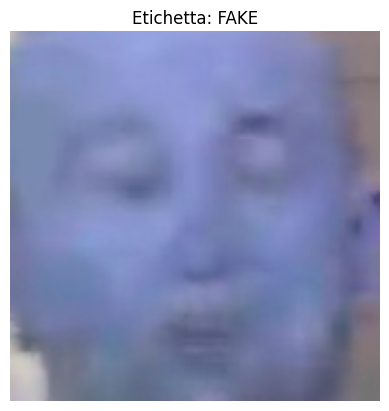

📊 Distribuzione delle classi (Chunk 8): {0: 2000, 1: 2000}
📊 Distribuzione delle classi (Training Set): {0: 1440, 1: 1440}
📊 Distribuzione delle classi (Validation Set): {0: 280, 1: 280}
📊 Distribuzione delle classi (Test Set): {0: 280, 1: 280}
Training set: 2880 samples
Validation set: 560 samples
Test set: 560 samples
Epoch 1/5
180/180 [==============================] - 356s 2s/step - loss: 0.3406 - accuracy: 0.8403 - val_loss: 0.2909 - val_accuracy: 0.8625
Epoch 2/5
180/180 [==============================] - 330s 2s/step - loss: 0.2876 - accuracy: 0.8642 - val_loss: 0.3014 - val_accuracy: 0.8679
Epoch 3/5
180/180 [==============================] - 336s 2s/step - loss: 0.2227 - accuracy: 0.8986 - val_loss: 0.3033 - val_accuracy: 0.8696
Epoch 4/5
180/180 [==============================] - 339s 2s/step - loss: 0.1973 - accuracy: 0.9160 - val_loss: 0.3027 - val_accuracy: 0.8571
Epoch 5/5
180/180 [==============================] - 344s 2s/step - loss: 0.1774 - accuracy: 0.9198 - val_loss

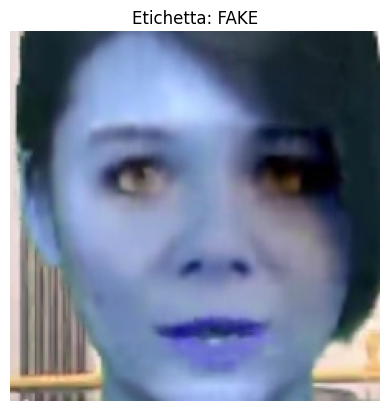

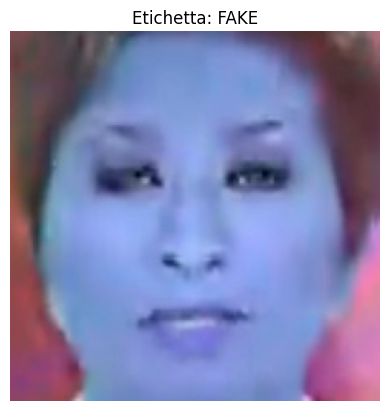

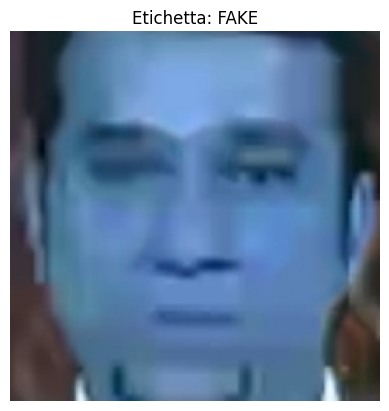

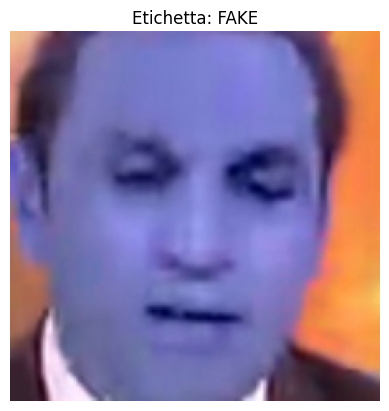

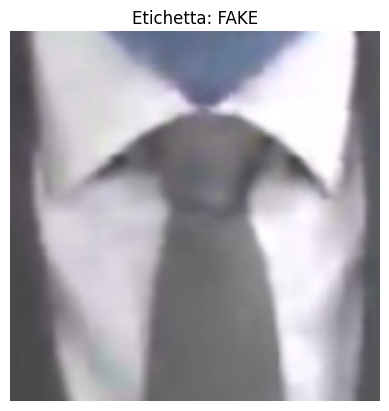

📊 Distribuzione delle classi (Chunk 9): {0: 2000, 1: 2000}
📊 Distribuzione delle classi (Training Set): {0: 1440, 1: 1440}
📊 Distribuzione delle classi (Validation Set): {0: 280, 1: 280}
📊 Distribuzione delle classi (Test Set): {0: 280, 1: 280}
Training set: 2880 samples
Validation set: 560 samples
Test set: 560 samples
Epoch 1/5
180/180 [==============================] - 347s 2s/step - loss: 0.3189 - accuracy: 0.8524 - val_loss: 0.3885 - val_accuracy: 0.8286
Epoch 2/5
180/180 [==============================] - 340s 2s/step - loss: 0.2658 - accuracy: 0.8837 - val_loss: 0.3453 - val_accuracy: 0.8286
Epoch 3/5
180/180 [==============================] - 332s 2s/step - loss: 0.2197 - accuracy: 0.9042 - val_loss: 0.3375 - val_accuracy: 0.8571
Epoch 4/5
180/180 [==============================] - 327s 2s/step - loss: 0.1919 - accuracy: 0.9160 - val_loss: 0.3022 - val_accuracy: 0.8679
Epoch 5/5
180/180 [==============================] - 328s 2s/step - loss: 0.1668 - accuracy: 0.9365 - val_loss

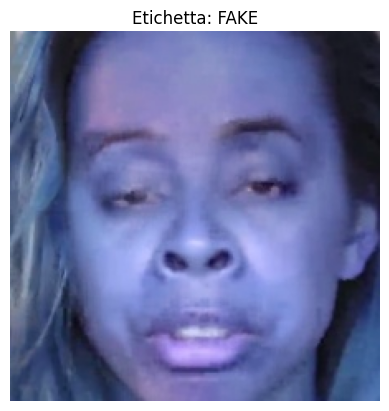

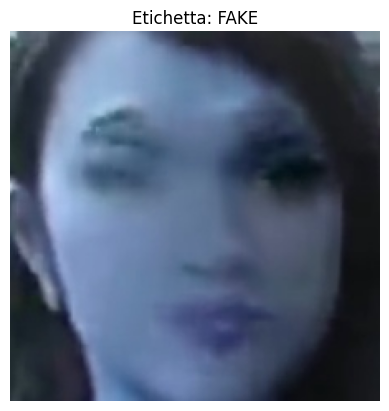

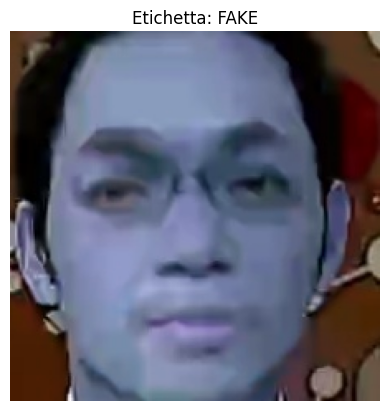

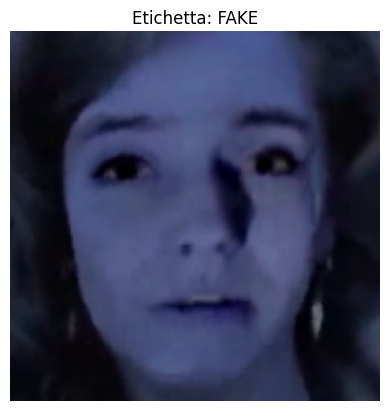

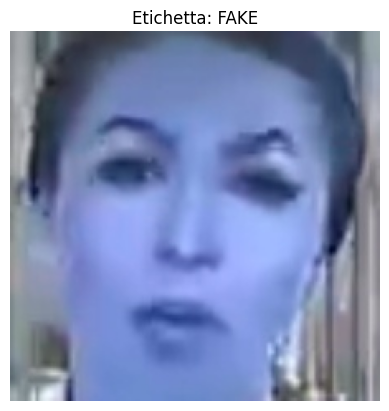

📊 Distribuzione delle classi (Chunk 10): {0: 2000, 1: 2000}
📊 Distribuzione delle classi (Training Set): {0: 1440, 1: 1440}
📊 Distribuzione delle classi (Validation Set): {0: 280, 1: 280}
📊 Distribuzione delle classi (Test Set): {0: 280, 1: 280}
Training set: 2880 samples
Validation set: 560 samples
Test set: 560 samples
Epoch 1/5
180/180 [==============================] - 337s 2s/step - loss: 0.3429 - accuracy: 0.8434 - val_loss: 0.2987 - val_accuracy: 0.8661
Epoch 2/5
180/180 [==============================] - 324s 2s/step - loss: 0.2588 - accuracy: 0.8774 - val_loss: 0.2866 - val_accuracy: 0.8714
Epoch 3/5
180/180 [==============================] - 324s 2s/step - loss: 0.2190 - accuracy: 0.9059 - val_loss: 0.2744 - val_accuracy: 0.8571
Epoch 4/5
180/180 [==============================] - 328s 2s/step - loss: 0.2085 - accuracy: 0.9122 - val_loss: 0.2710 - val_accuracy: 0.8893
Epoch 5/5
180/180 [==============================] - 329s 2s/step - loss: 0.1596 - accuracy: 0.9396 - val_los

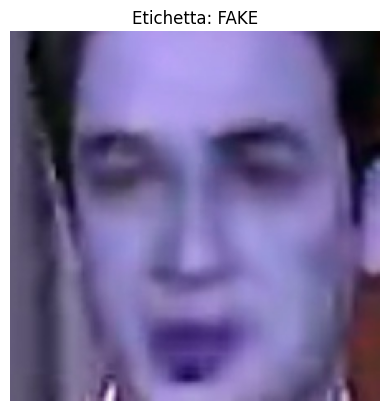

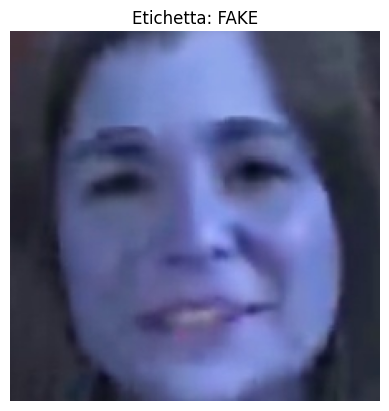

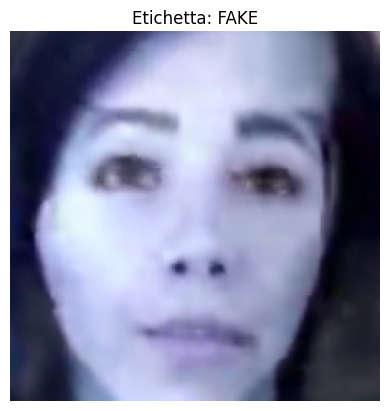

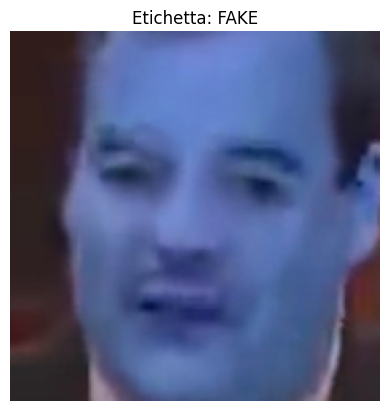

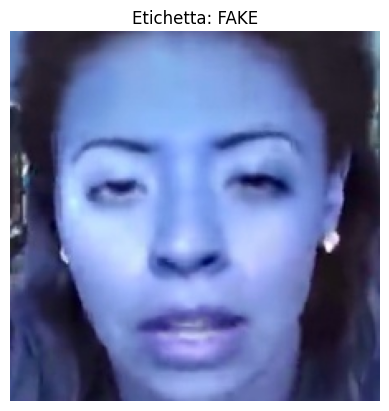

📊 Distribuzione delle classi (Chunk 11): {0: 2000, 1: 2000}
📊 Distribuzione delle classi (Training Set): {0: 1440, 1: 1440}
📊 Distribuzione delle classi (Validation Set): {0: 280, 1: 280}
📊 Distribuzione delle classi (Test Set): {0: 280, 1: 280}
Training set: 2880 samples
Validation set: 560 samples
Test set: 560 samples
Epoch 1/5
180/180 [==============================] - 344s 2s/step - loss: 0.3136 - accuracy: 0.8573 - val_loss: 0.2879 - val_accuracy: 0.8696
Epoch 2/5
180/180 [==============================] - 329s 2s/step - loss: 0.2506 - accuracy: 0.8910 - val_loss: 0.2594 - val_accuracy: 0.8661
Epoch 3/5
180/180 [==============================] - 332s 2s/step - loss: 0.2079 - accuracy: 0.9125 - val_loss: 0.3595 - val_accuracy: 0.8054
Epoch 4/5
180/180 [==============================] - 327s 2s/step - loss: 0.1883 - accuracy: 0.9247 - val_loss: 0.2777 - val_accuracy: 0.8571
Epoch 5/5
180/180 [==============================] - 332s 2s/step - loss: 0.1584 - accuracy: 0.9410 - val_los

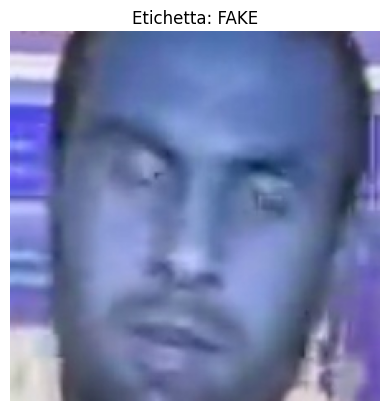

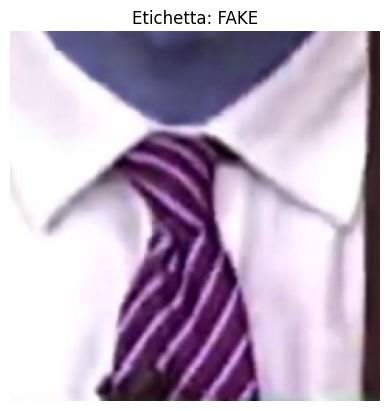

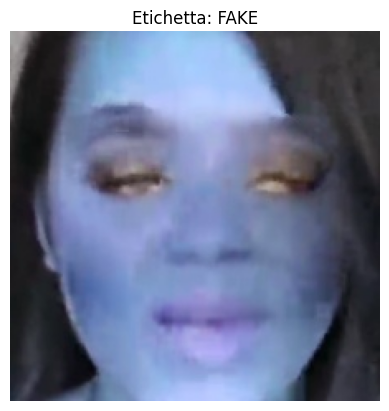

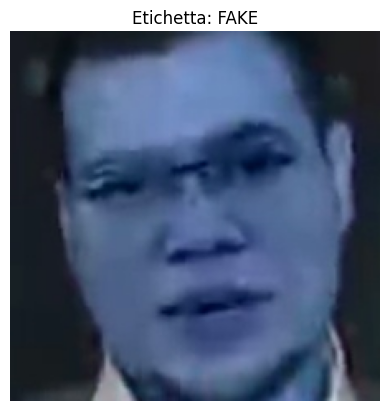

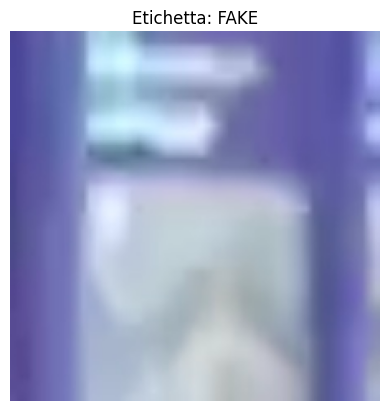

📊 Distribuzione delle classi (Chunk 12): {0: 2000, 1: 2000}
📊 Distribuzione delle classi (Training Set): {0: 1440, 1: 1440}
📊 Distribuzione delle classi (Validation Set): {0: 280, 1: 280}
📊 Distribuzione delle classi (Test Set): {0: 280, 1: 280}
Training set: 2880 samples
Validation set: 560 samples
Test set: 560 samples
Epoch 1/5
180/180 [==============================] - 341s 2s/step - loss: 0.3096 - accuracy: 0.8604 - val_loss: 0.2733 - val_accuracy: 0.8643
Epoch 2/5
180/180 [==============================] - 332s 2s/step - loss: 0.2410 - accuracy: 0.8906 - val_loss: 0.3097 - val_accuracy: 0.8589
Epoch 3/5
180/180 [==============================] - 328s 2s/step - loss: 0.2079 - accuracy: 0.9083 - val_loss: 0.2575 - val_accuracy: 0.8750
Epoch 4/5
180/180 [==============================] - 321s 2s/step - loss: 0.1768 - accuracy: 0.9292 - val_loss: 0.2856 - val_accuracy: 0.8571
Epoch 5/5
180/180 [==============================] - 326s 2s/step - loss: 0.1551 - accuracy: 0.9378 - val_los

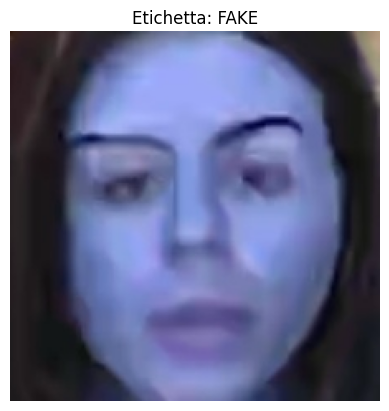

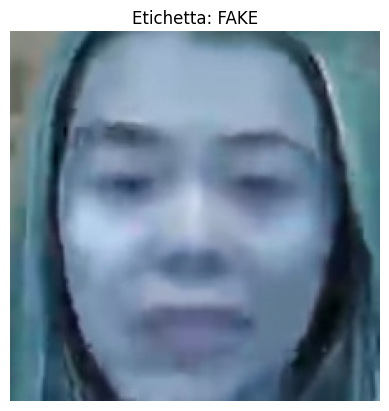

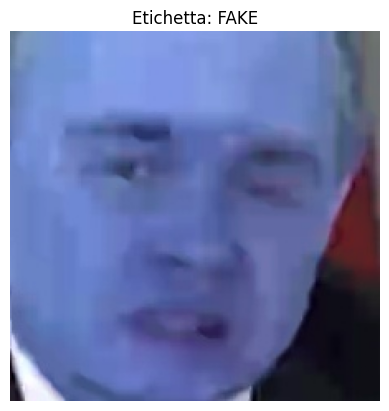

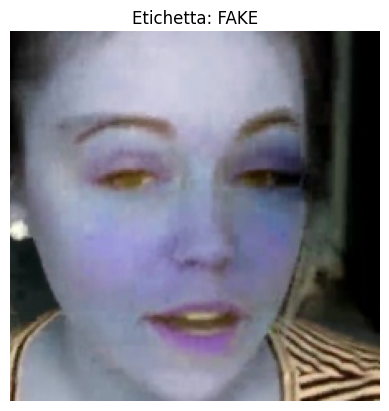

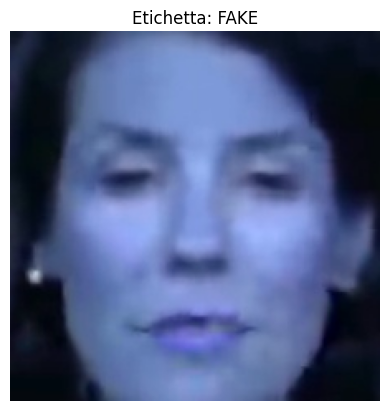

📊 Distribuzione delle classi (Chunk 13): {0: 2000, 1: 2000}
📊 Distribuzione delle classi (Training Set): {0: 1440, 1: 1440}
📊 Distribuzione delle classi (Validation Set): {0: 280, 1: 280}
📊 Distribuzione delle classi (Test Set): {0: 280, 1: 280}
Training set: 2880 samples
Validation set: 560 samples
Test set: 560 samples
Epoch 1/5
180/180 [==============================] - 363s 2s/step - loss: 0.2881 - accuracy: 0.8708 - val_loss: 0.3088 - val_accuracy: 0.8518
Epoch 2/5
180/180 [==============================] - 355s 2s/step - loss: 0.2082 - accuracy: 0.9104 - val_loss: 0.3013 - val_accuracy: 0.8536
Epoch 3/5
180/180 [==============================] - 325s 2s/step - loss: 0.1709 - accuracy: 0.9344 - val_loss: 0.2530 - val_accuracy: 0.8768
Epoch 4/5
180/180 [==============================] - 323s 2s/step - loss: 0.1417 - accuracy: 0.9434 - val_loss: 0.2770 - val_accuracy: 0.8661
Epoch 5/5
180/180 [==============================] - 322s 2s/step - loss: 0.1390 - accuracy: 0.9458 - val_los

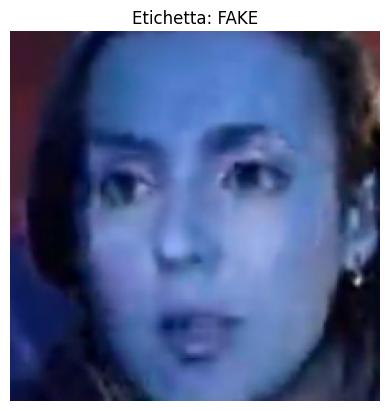

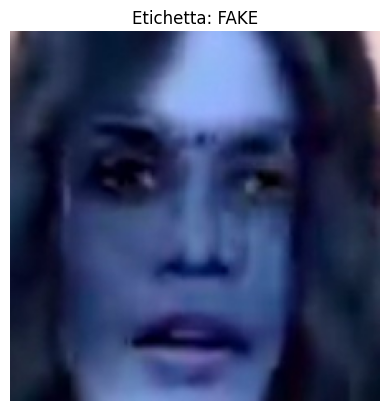

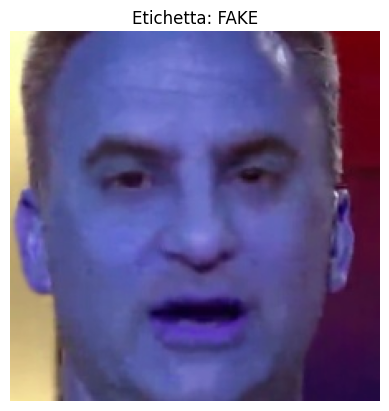

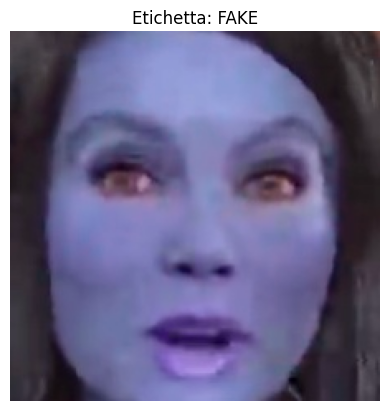

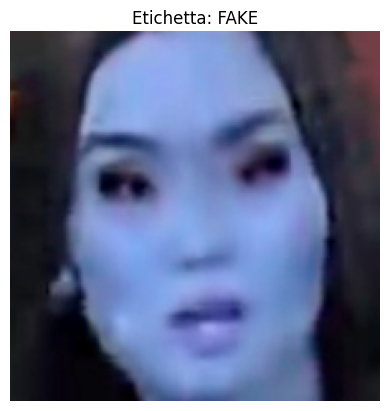

📊 Distribuzione delle classi (Chunk 14): {0: 483, 1: 51}
📊 Distribuzione delle classi (Training Set): {0: 347, 1: 37}
📊 Distribuzione delle classi (Validation Set): {0: 68, 1: 7}
📊 Distribuzione delle classi (Test Set): {0: 68, 1: 7}
Training set: 384 samples
Validation set: 75 samples
Test set: 75 samples
Epoch 1/5
24/24 [==============================] - 45s 2s/step - loss: 0.1213 - accuracy: 0.9557 - val_loss: 0.1445 - val_accuracy: 0.9200
Epoch 2/5
24/24 [==============================] - 43s 2s/step - loss: 0.0738 - accuracy: 0.9740 - val_loss: 0.0862 - val_accuracy: 0.9867
Epoch 3/5
24/24 [==============================] - 43s 2s/step - loss: 0.0537 - accuracy: 0.9766 - val_loss: 0.1065 - val_accuracy: 0.9867
Epoch 4/5
24/24 [==============================] - 45s 2s/step - loss: 0.0469 - accuracy: 0.9922 - val_loss: 0.0975 - val_accuracy: 0.9600
Epoch 5/5
3/3 [==============================] - 7s 2s/step - loss: 0.1377 - accuracy: 0.9333
Test Accuracy: 0.9333333373069763


In [ ]:
# --- BLOCCO DI TRAINING DEL MODELLO ---

import tensorflow as tf
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, Flatten
from tensorflow.keras.optimizers.legacy import Adam
import os
from sklearn.model_selection import train_test_split
import numpy as np
import matplotlib.pyplot as plt

def visualize_data(images, labels, num_samples=5):
    for i in range(num_samples):
        plt.imshow(images[i])
        plt.title(f"Etichetta: {'FAKE' if labels[i] == 1 else 'REAL'}")
        plt.axis('off')
        plt.show()

# Funzione per caricare i dati in batch
def load_data_in_batches(batch_index):
    faces = np.load(f"data_chunks/faces_chunk_{batch_index}.npy")
    labels = np.load(f"data_chunks/labels_chunk_{batch_index}.npy")
    origins = np.load(f"data_chunks/origins_chunk_{batch_index}.npy")
    print(f"✅ Loaded chunk {batch_index} from disk.")
    return faces, labels, origins

# Funzione per verificare la distribuzione delle classi
def check_class_distribution(labels, stage):
    unique, counts = np.unique(labels, return_counts=True)
    distribution = dict(zip(unique, counts))
    print(f"📊 Distribuzione delle classi ({stage}): {distribution}")
    return distribution

# Carica il modello pre-addestrato VGG16 senza il top
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Congela i pesi del modello pre-addestrato
for layer in base_model.layers:
    layer.trainable = False

# Aggiungi i tuoi livelli di classificazione
x = Flatten()(base_model.output)
x = Dense(256, activation='relu')(x)    # Ridotto da 512 a 256
x = Dense(1, activation='sigmoid')(x)

# Crea il modello
model = Model(inputs=base_model.input, outputs=x)

# Compila il modello
model.compile(optimizer=Adam(learning_rate=0.0001), loss='binary_crossentropy', metrics=['accuracy'])

# Addestra il modello su ogni chunk
num_chunks = len(os.listdir("data_chunks")) // 3  # Numero di chunk salvati (3 file per chunk: faces, labels, origins)
for chunk_index in range(num_chunks):
    print(f"Caricamento del chunk {chunk_index} per il training...")
    faces_batch, labels_batch, origins_batch = load_data_in_batches(chunk_index)
    
    # Visualizza alcune immagini del batch
    visualize_data(faces_batch, labels_batch, num_samples=5)  # Visualizza 5 immagini con le loro etichette

    # Verifica la distribuzione delle classi nel batch
    check_class_distribution(labels_batch, f"Chunk {chunk_index}")
    
    # Split del chunk in training, validation e test set con stratificazione
    X_train, X_temp, y_train, y_temp = train_test_split(
        faces_batch, labels_batch, test_size=0.28, random_state=42, stratify=labels_batch
    )
    X_val, X_test, y_val, y_test = train_test_split(
        X_temp, y_temp, test_size=0.5, random_state=42, stratify=y_temp
    )
    
    # Verifica la distribuzione delle classi nei set
    check_class_distribution(y_train, "Training Set")
    check_class_distribution(y_val, "Validation Set")
    check_class_distribution(y_test, "Test Set")
    
    print(f"Training set: {len(X_train)} samples")
    print(f"Validation set: {len(X_val)} samples")
    print(f"Test set: {len(X_test)} samples")
    
    # Addestra il modello sul chunk corrente
    history = model.fit(X_train, y_train, epochs=5, validation_data=(X_val, y_val), batch_size=16)

# Valuta il modello sull'ultimo chunk
loss, accuracy = model.evaluate(X_test, y_test)
print(f"Test Accuracy: {accuracy}")

In [ ]:
# --- BLOCCO DI SALVATAGGIO DEL MODELLO LEGACY ---

# Salvataggio del modello completo (architettura + pesi + configurazione + ottimizzatore) in formato legacy HDF5
model.save("deepfake_model-chunks_vgg16.h5")
print("✅ Modello salvato in deepfake_model_vgg16.h5")

/Users/vittoriostile/anaconda3/envs/testEnv1/lib/python3.11/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


✅ Modello salvato in deepfake_model_vgg16.h5


In [ ]:
# --- BLOCCO DI SALVATAGGIO DEL MODELLO ---

# Salvataggio del modello completo (architettura + pesi + configurazione + ottimizzatore) in formato moderno Keras
model.save("deepfake_model-chunks_vgg16.keras")
print("✅ Modello salvato con legacy.Adam nel formato .keras")

✅ Modello salvato con legacy.Adam nel formato .keras


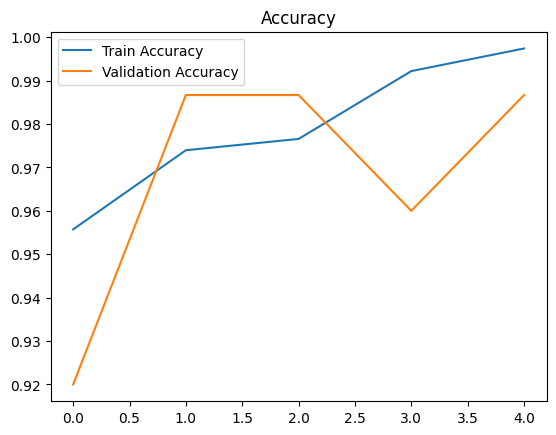

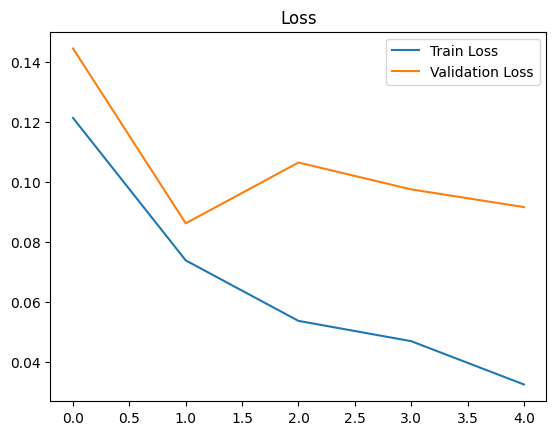

In [ ]:
# Plot training and validation accuracy dell'ultimo training
plt.plot(history.history['accuracy'], label='Train Accuracy') # history.history['accuracy']: Contiene i valori di accuratezza calcolati dal modello su ogni epoca per il training set
plt.plot(history.history['val_accuracy'], label='Validation Accuracy') # history.history['val_accuracy']: valori calcolati sul validation set dopo ogni epoca, ci dice quanto bene il modello generalizza su dati non visti durante il training
plt.legend() # Stampa la leggenda in basso a dx
plt.title('Accuracy') # Da il titolo al grafico in alto
plt.show()

# Plot training and validation loss dell'ultimo training
plt.plot(history.history['loss'], label='Train Loss') # history.history['loss']: i valori della funzione di perdita calcolati dal modello sul training set durante ogni epoca
plt.plot(history.history['val_loss'], label='Validation Loss') # history.history['val_loss']: i valori calcolati sul validation set dopo ogni epoca, ci dice quanto bene il modello generalizza su dati non visti
plt.legend()
plt.title('Loss')
plt.show()


## Test del modello
### Spiegazione del codice di seguito:

1. Calcola il numero totale di frame analizzati.
2. Calcola il numero di frame FAKE e REAL correttamente identificati.
3. Calcola la percentuale di frame correttamente identificati.
4. Stampa una leggenda che spiega cosa significano le etichette 1 e 0.
5. Stampa il numero totale di frame analizzati, il numero di frame FAKE e REAL correttamente identificati, e la percentuale di frame correttamente identificati.
6. Stampa la lista dei frame correttamente identificati con la percentuale predetta e l'etichetta reale.
7. Stampa il numero di frame non correttamente riconosciuti e la lista dei frame non correttamente riconosciuti con la percentuale predetta e l'etichetta reale.


### Test su ultimo chunk

In [ ]:
# Predizione delle probabilità sui frame di test
predictions = model.predict(X_test)  # Probabilità per ogni frame
predicted_labels = (predictions > 0.50).astype(int).flatten()  # Soglia: % per decretare un video come FAKE. Per sicurezza "appiattiamo" che serve per appiattire array multidimensionali in un array 1D. Esempio: da [[1], [0], [1]] a [1, 0, 1].

# Ground truth
true_labels = y_test.flatten() # Questo rappresenta la ground truth: ovvero le etichette reali (0 per REAL, 1 per FAKE) che il modello deve imparare a predire.

# Indici dei frame predetti come FAKE e REAL
fake_indices = np.where(predicted_labels == 1)[0]  # Indici dei frame FAKE
real_indices = np.where(predicted_labels == 0)[0]  # Indici dei frame REAL

# Frame realmente REAL e FAKE
num_real_fake_frames = np.sum(true_labels == 1)
num_real_real_frames = np.sum(true_labels == 0)

# Frame identificati come FAKE e REAL
num_fake_frames = len(fake_indices)
num_real_frames = len(real_indices)

# Frame correttamente predetti
num_correct_fake_frames = np.count_nonzero((predicted_labels == 1) & (true_labels == 1))
num_correct_real_frames = np.count_nonzero((predicted_labels == 0) & (true_labels == 0))

# Frame FAKE identificati come REAL e REAL identificati come FAKE
num_fake_as_real = np.count_nonzero((predicted_labels == 0) & (true_labels == 1)) # False Negatives
num_real_as_fake = np.count_nonzero((predicted_labels == 1) & (true_labels == 0)) # False Positive

# Percentuali
percent_fake_frames = (num_fake_frames / num_real_fake_frames) * 100
percent_real_frames = (num_real_frames / num_real_real_frames) * 100
percent_correct_fake = (num_correct_fake_frames / num_real_fake_frames) * 100
percent_correct_real = (num_correct_real_frames / num_real_real_frames) * 100

# Output
print("📌 Leggenda: Etichetta 1 = FAKE, Etichetta 0 = REAL — Soglia di classificazione: > 50%\n")

print(f"🎞️  Numero totale di frame analizzati: {len(true_labels)}")
print(f"✅ Numero di frame realmente REAL: {num_real_real_frames}")
print(f"❌ Numero di frame realmente FAKE: {num_real_fake_frames}\n")

print(f"🧠 Numero di frame identificati come FAKE: {num_fake_frames} ({percent_fake_frames:.2f}%)")
print(f"🧠 Numero di frame identificati come REAL: {num_real_frames} ({percent_real_frames:.2f}%)\n")

print(f"✅ Frame FAKE correttamente identificati (True Positives): {num_correct_fake_frames} ({percent_correct_fake:.2f}%)")
print(f"✅ Frame REAL correttamente identificati (True Negatives): {num_correct_real_frames} ({percent_correct_real:.2f}%)\n")

print(f"⚠️ Frame FAKE identificati come REAL (False Negatives): {num_fake_as_real}")
print(f"⚠️ Frame REAL identificati come FAKE (False Positive): {num_fake_as_real}\n")

NameError: name 'X_test' is not defined

In [ ]:
# Calcolo True/False Positive/Negative
total_fake = np.sum(true_labels == 1)
total_real = np.sum(true_labels == 0)

true_positive = np.count_nonzero((predicted_labels == 1) & (true_labels == 1))
true_negative = np.count_nonzero((predicted_labels == 0) & (true_labels == 0))
false_positive = np.count_nonzero((predicted_labels == 1) & (true_labels == 0))
false_negative = np.count_nonzero((predicted_labels == 0) & (true_labels == 1))

# Percentuali
tp_percent = (true_positive / total_fake) * 100
tn_percent = (true_negative / total_real) * 100
fp_percent = (false_positive / total_real) * 100
fn_percent = (false_negative / total_fake) * 100

# Output percentuali
print("📊 Percentuali di classificazione rispetto ai dati reali:\n")
print(f"✅ True Positives (FAKE corretti): {true_positive} su {total_fake} → {tp_percent:.2f}%")
print(f"✅ True Negatives (REAL corretti): {true_negative} su {total_real} → {tn_percent:.2f}%")
print(f"❌ False Positives (REAL scambiati per FAKE): {false_positive} su {total_real} → {fp_percent:.2f}%")
print(f"❌ False Negatives (FAKE scambiati per REAL): {false_negative} su {total_fake} → {fn_percent:.2f}%\n")

NameError: name 'true_labels' is not defined

In [ ]:
print("Percentuale di predizione per ogni frame non correttamente riconosciuto (con etichetta associata):")

total_frames = len(true_labels)

for i in range(total_frames):
    if predicted_labels[i] != true_labels[i]:
        print(f"Frame {i + 1}: {predictions[i][0]:.2f} (Etichetta reale: {true_labels[i]}) ❗ PREDIZIONE ERRATA")

Percentuale di predizione per ogni frame non correttamente riconosciuto (con etichetta associata):
Frame 10: 0.85 (Etichetta reale: 0) ❗ PREDIZIONE ERRATA
Frame 11: 0.76 (Etichetta reale: 0) ❗ PREDIZIONE ERRATA
Frame 23: 0.36 (Etichetta reale: 1) ❗ PREDIZIONE ERRATA
Frame 31: 0.73 (Etichetta reale: 0) ❗ PREDIZIONE ERRATA
Frame 50: 0.08 (Etichetta reale: 1) ❗ PREDIZIONE ERRATA


In [ ]:
print("\n📄 Percentuale di predizione per ogni frame (con etichetta associata):")

for i in range(total_frames):
    predizione_errata = " ❗ PREDIZIONE ERRATA" if predicted_labels[i] != true_labels[i] else ""
    print(f"Frame {i + 1}: {predictions[i][0]:.2f} (Etichetta reale: {true_labels[i]}){predizione_errata}")


📄 Percentuale di predizione per ogni frame (con etichetta associata):
Frame 1: 0.00 (Etichetta reale: 0)
Frame 2: 0.05 (Etichetta reale: 0)
Frame 3: 0.00 (Etichetta reale: 0)
Frame 4: 0.04 (Etichetta reale: 0)
Frame 5: 0.00 (Etichetta reale: 0)
Frame 6: 0.00 (Etichetta reale: 0)
Frame 7: 0.01 (Etichetta reale: 0)
Frame 8: 0.05 (Etichetta reale: 0)
Frame 9: 0.00 (Etichetta reale: 0)
Frame 10: 0.85 (Etichetta reale: 0) ❗ PREDIZIONE ERRATA
Frame 11: 0.76 (Etichetta reale: 0) ❗ PREDIZIONE ERRATA
Frame 12: 0.00 (Etichetta reale: 0)
Frame 13: 0.01 (Etichetta reale: 0)
Frame 14: 0.90 (Etichetta reale: 1)
Frame 15: 0.00 (Etichetta reale: 0)
Frame 16: 0.00 (Etichetta reale: 0)
Frame 17: 0.16 (Etichetta reale: 0)
Frame 18: 0.01 (Etichetta reale: 0)
Frame 19: 0.00 (Etichetta reale: 0)
Frame 20: 0.19 (Etichetta reale: 0)
Frame 21: 0.01 (Etichetta reale: 0)
Frame 22: 0.00 (Etichetta reale: 0)
Frame 23: 0.36 (Etichetta reale: 1) ❗ PREDIZIONE ERRATA
Frame 24: 0.00 (Etichetta reale: 0)
Frame 25: 0.01

### Test sui dati di test di tutti i chunk 

In [ ]:
# Test su tutti i dati di test provenienti dai vari chunk in un unico set di test e poi eseguire la predizione utilizzando il modello addestrato

import numpy as np

# Inizializza i dati di test combinati
all_X_test = []
all_y_test = []
all_origins = []  # Se provengono da REAL o FAKE
all_filenames = []  # Per salvare i nomi dei file

# Usa lo stesso seed per garantire la riproducibilità
seed = 42

# Itera su tutti i chunk per raccogliere i dati di test
num_chunks = len(os.listdir("data_chunks")) // 4  # Numero di chunk salvati (4 file per chunk: faces, labels, origins, filenames)
for chunk_index in range(num_chunks):
    print(f"Caricamento del chunk {chunk_index} per il test...")
    faces_batch = np.load(f"data_chunks/faces_chunk_{chunk_index}.npy")
    labels_batch = np.load(f"data_chunks/labels_chunk_{chunk_index}.npy")
    origins_batch = np.load(f"data_chunks/origins_chunk_{chunk_index}.npy")
    filenames_batch = np.load(f"data_chunks/filenames_chunk_{chunk_index}.npy")  # Carica i nomi dei file
    
    # Split del chunk in training, validation e test set con stratificazione
    _, X_temp, _, y_temp, _, origins_temp, _, filenames_temp = train_test_split(
        faces_batch, labels_batch, origins_batch, filenames_batch, test_size=0.28, random_state=seed, stratify=labels_batch
    )
    _, X_test, _, y_test, _, origins_test, _, filenames_test = train_test_split(
        X_temp, y_temp, origins_temp, filenames_temp, test_size=0.5, random_state=seed, stratify=y_temp
    )
    
    # Aggiungi i dati di test al set combinato
    all_X_test.append(X_test)
    all_y_test.append(y_test)
    all_origins.extend(origins_test)  # Estrai le origini (REAL o FAKE) e aggiungile al set combinato
    all_filenames.extend(filenames_test)  # Estrai i nomi dei file e aggiungili al set combinato

# Combina tutti i dati di test in un unico array
all_X_test = np.concatenate(all_X_test, axis=0)
all_y_test = np.concatenate(all_y_test, axis=0)
all_origins = np.array(all_origins)  # Converti in array numpy
all_filenames = np.array(all_filenames)  # Converti in array numpy

print(f"✅ Dati di test combinati: {len(all_X_test)} campioni")

Caricamento del chunk 0 per il test...
Caricamento del chunk 1 per il test...
Caricamento del chunk 2 per il test...
Caricamento del chunk 3 per il test...
Caricamento del chunk 4 per il test...
Caricamento del chunk 5 per il test...
Caricamento del chunk 6 per il test...
Caricamento del chunk 7 per il test...
Caricamento del chunk 8 per il test...
Caricamento del chunk 9 per il test...
Caricamento del chunk 10 per il test...
Caricamento del chunk 11 per il test...
Caricamento del chunk 12 per il test...
Caricamento del chunk 13 per il test...
✅ Dati di test combinati: 7840 campioni


In [ ]:

# --- FILTRO SOLO FRAME _face0 ---
def filter_face0_samples(X, y, origins, filenames):
    """
    Restituisce solo i campioni il cui filename contiene '_face0'
    """
    mask = np.array([("_face0" in fname) for fname in filenames])
    return X[mask], y[mask], origins[mask], filenames[mask]

# Filtra i dati per includere solo i frame _face0
all_X_test, all_y_test, all_origins, all_filenames = filter_face0_samples(
    all_X_test, all_y_test, all_origins, all_filenames
)

print(f"✅ Dati di test filtrati (_face0): {len(all_X_test)} campioni")

✅ Dati di test filtrati (_face0): 6967 campioni


In [ ]:

# Predizione sui dati di test combinati
predictions = model.predict(all_X_test)  # Probabilità per ogni frame
predicted_labels = (predictions > 0.50).astype(int).flatten()  # Soglia: 50%

# Ground truth
true_labels = all_y_test.flatten()

# Calcolo delle metriche
num_real_fake_frames = np.sum(true_labels == 1)
num_real_real_frames = np.sum(true_labels == 0)

num_fake_frames = np.sum(predicted_labels == 1)
num_real_frames = np.sum(predicted_labels == 0)

num_correct_fake_frames = np.count_nonzero((predicted_labels == 1) & (true_labels == 1))
num_correct_real_frames = np.count_nonzero((predicted_labels == 0) & (true_labels == 0))

num_fake_as_real = np.count_nonzero((predicted_labels == 0) & (true_labels == 1))  # False Negatives
num_real_as_fake = np.count_nonzero((predicted_labels == 1) & (true_labels == 0))  # False Positives

# Percentuali
percent_fake_frames = (num_fake_frames / num_real_fake_frames) * 100
percent_real_frames = (num_real_frames / num_real_real_frames) * 100
percent_correct_fake = (num_correct_fake_frames / num_real_fake_frames) * 100
percent_correct_real = (num_correct_real_frames / num_real_real_frames) * 100

# Output
print("📌 Leggenda: Etichetta 1 = FAKE, Etichetta 0 = REAL — Soglia di classificazione: > 50%\n")

print(f"🎞️  Numero totale di frame analizzati: {len(true_labels)}")
print(f"✅ Numero di frame realmente REAL: {num_real_real_frames}")
print(f"❌ Numero di frame realmente FAKE: {num_real_fake_frames}\n")

print(f"🧠 Numero di frame identificati come FAKE: {num_fake_frames} ({percent_fake_frames:.2f}%)")
print(f"🧠 Numero di frame identificati come REAL: {num_real_frames} ({percent_real_frames:.2f}%)\n")

print(f"✅ Frame FAKE correttamente identificati (True Positives): {num_correct_fake_frames} ({percent_correct_fake:.2f}%)")
print(f"✅ Frame REAL correttamente identificati (True Negatives): {num_correct_real_frames} ({percent_correct_real:.2f}%)\n")

print(f"⚠️ Frame FAKE identificati come REAL (False Negatives): {num_fake_as_real}")
print(f"⚠️ Frame REAL identificati come FAKE (False Positives): {num_real_as_fake}\n")

# Stampa dei frame non correttamente riconosciuti con i nomi originali
print("Percentuale di predizione per ogni frame non correttamente riconosciuto (con nome originale):")
for i in range(len(true_labels)):
    if predicted_labels[i] != true_labels[i]:
        print(f"Frame {i + 1} (Filename: {all_filenames[i]} - Origine: {all_origins[i]}): {predictions[i][0]:.2f} (Etichetta reale: {true_labels[i]}) ❗ PREDIZIONE ERRATA")

218/218 [==============================] - 844s 4s/step
📌 Leggenda: Etichetta 1 = FAKE, Etichetta 0 = REAL — Soglia di classificazione: > 50%

🎞️  Numero totale di frame analizzati: 6967
✅ Numero di frame realmente REAL: 3478
❌ Numero di frame realmente FAKE: 3489

🧠 Numero di frame identificati come FAKE: 2654 (76.07%)
🧠 Numero di frame identificati come REAL: 4313 (124.01%)

✅ Frame FAKE correttamente identificati (True Positives): 2558 (73.32%)
✅ Frame REAL correttamente identificati (True Negatives): 3382 (97.24%)

⚠️ Frame FAKE identificati come REAL (False Negatives): 931
⚠️ Frame REAL identificati come FAKE (False Positives): 96

Percentuale di predizione per ogni frame non correttamente riconosciuto (con nome originale):
Frame 10 (Filename: 567_606_180_face0.jpeg - Origine: FAKE): 0.18 (Etichetta reale: 1) ❗ PREDIZIONE ERRATA
Frame 13 (Filename: 651_835_220_face0.jpeg - Origine: FAKE): 0.18 (Etichetta reale: 1) ❗ PREDIZIONE ERRATA
Frame 22 (Filename: 283_313_240_face0.jpeg - Or

<Figure size 800x600 with 0 Axes>

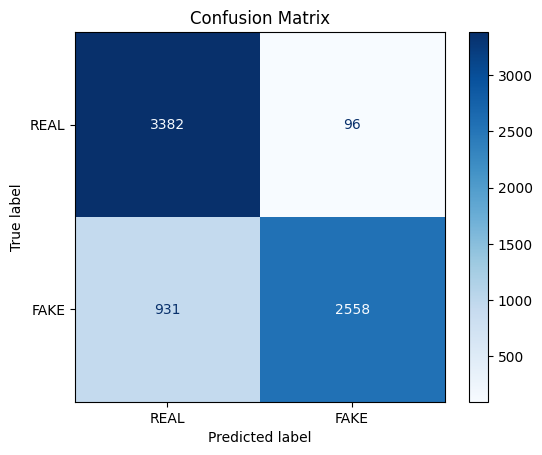

Classification Report:

              precision    recall  f1-score   support

        REAL     0.7841    0.9724    0.8682      3478
        FAKE     0.9638    0.7332    0.8328      3489

    accuracy                         0.8526      6967
   macro avg     0.8740    0.8528    0.8505      6967
weighted avg     0.8741    0.8526    0.8505      6967



In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, classification_report, ConfusionMatrixDisplay

# Calcolo della confusion matrix
cm = confusion_matrix(true_labels, predicted_labels)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["REAL", "FAKE"])

# Visualizzazione della confusion matrix
plt.figure(figsize=(8, 6))
disp.plot(cmap=plt.cm.Blues, values_format='d')
plt.title("Confusion Matrix")
plt.show()

# Calcolo e stampa delle metriche di classificazione con 4 cifre decimali
report = classification_report(true_labels, predicted_labels, target_names=["REAL", "FAKE"], digits=4)
print("Classification Report:\n")
print(report)

In [ ]:
print(f"✅ Dati di test filtrati (_face0): {len(all_X_test)} campioni")

# Stampa la lista dei nomi dei file della lista di test in formato lista (uno per riga, pronto per Excel)
print("Lista dei nomi dei file di test (_face0):")
for filename in all_filenames:
    print(filename)

✅ Dati di test filtrati (_face0): 6967 campioni
Lista dei nomi dei file di test (_face0):
086_090_660_face0.jpeg
776_676_260_face0.jpeg
924_820_face0.jpeg
011_100_face0.jpeg
455_471_100_face0.jpeg
344_060_face0.jpeg
073_380_face0.jpeg
774_735_220_face0.jpeg
579_701_100_face0.jpeg
567_606_180_face0.jpeg
603_060_face0.jpeg
730_200_face0.jpeg
651_835_220_face0.jpeg
169_227_200_face0.jpeg
598_178_120_face0.jpeg
913_893_020_face0.jpeg
607_683_200_face0.jpeg
213_083_360_face0.jpeg
830_828_420_face0.jpeg
598_120_face0.jpeg
552_300_face0.jpeg
283_313_240_face0.jpeg
311_240_face0.jpeg
374_380_face0.jpeg
924_240_face0.jpeg
935_733_420_face0.jpeg
313_283_460_face0.jpeg
918_934_300_face0.jpeg
454_280_face0.jpeg
540_536_000_face0.jpeg
873_780_face0.jpeg
266_252_040_face0.jpeg
629_500_face0.jpeg
886_200_face0.jpeg
485_425_640_face0.jpeg
177_211_280_face0.jpeg
317_080_face0.jpeg
943_942_400_face0.jpeg
681_700_face0.jpeg
185_276_140_face0.jpeg
533_040_face0.jpeg
894_040_face0.jpeg
747_854_260_face0.jp

<Figure size 600x500 with 0 Axes>

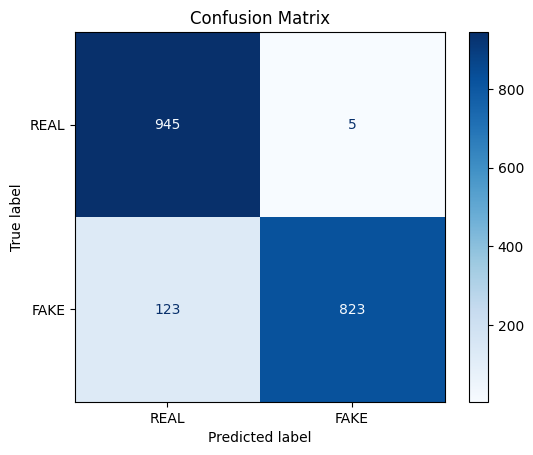

Classification Report:

              precision    recall  f1-score   support

        REAL     0.8848    0.9947    0.9366       950
        FAKE     0.9940    0.8700    0.9278       946

    accuracy                         0.9325      1896
   macro avg     0.9394    0.9324    0.9322      1896
weighted avg     0.9393    0.9325    0.9322      1896



In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, classification_report, ConfusionMatrixDisplay

# Simulazione dei dati secondo i tuoi numeri
# 0 = REAL, 1 = FAKE
true_labels = np.array([0]*950 + [1]*946)
predicted_labels = np.array(
    [0]*945 + [1]*5 +    # 945 REAL corretti, 5 REAL sbagliati (scambiati per FAKE)
    [0]*123 + [1]*823    # 123 FAKE sbagliati (scambiati per REAL), 823 FAKE corretti
)

# Calcolo della confusion matrix
cm = confusion_matrix(true_labels, predicted_labels)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["REAL", "FAKE"])

# Visualizzazione della confusion matrix
plt.figure(figsize=(6, 5))
disp.plot(cmap=plt.cm.Blues, values_format='d')
plt.title("Confusion Matrix")
plt.show()

# Calcolo e stampa delle metriche di classificazione con 4 cifre decimali
report = classification_report(true_labels, predicted_labels, target_names=["REAL", "FAKE"], digits=4)
print("Classification Report:\n")
print(report)